In [1]:
import statistics as st
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import random
import math
from keras.regularizers import l1, l2
from keras.regularizers import l1_l2
from keras.callbacks import EarlyStopping, ModelCheckpoint
import time
from collections import Counter
from scipy.signal import find_peaks
import collections
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
import matplotlib.colors as colors
from sklearn.manifold import Isomap

In [2]:
FF_df = pd.read_csv('form_factors.csv')
TD_x_df = pd.read_csv('gpr_total_density_x_200.csv')
TD_y_df = pd.read_csv('gpr_total_density_y_200.csv')

FF_df = FF_df.transpose()
TD_x_df = TD_x_df.transpose()
TD_y_df = TD_y_df.transpose()

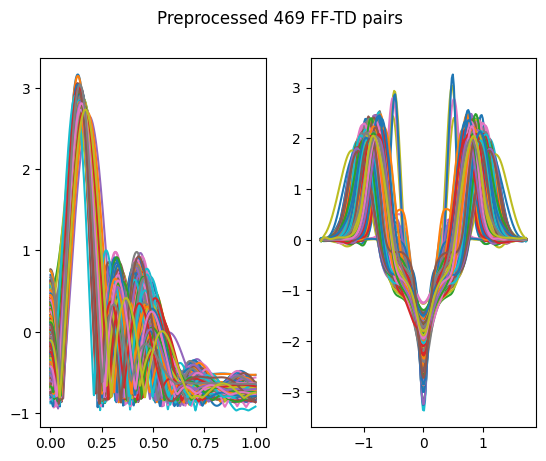

In [6]:
def get_peak_data(FF_df,TD_y_df):
    FF_min_and_max_points = []
    FF_min_and_max_points_amounts = []
    
    TD_min_and_max_points = []
    TD_min_and_max_points_amounts = []
    
    for column in FF_df.columns:
        max_peaks_FF, _ = find_peaks(FF_df[column])
        min_peaks_FF, _ = find_peaks(-FF_df[column])
        
        FF_peak_indexes = np.hstack((max_peaks_FF, min_peaks_FF))
        FF_peak_indexes.sort()
        FF_peak_value = FF_df[column][FF_peak_indexes]
        
        FF_min_and_max_points.append(list(FF_peak_value))
        FF_min_and_max_points_amounts.append([len(min_peaks_FF), len(max_peaks_FF)])
        
        max_peaks_TD, _ = find_peaks(TD_y_df[column])
        min_peaks_TD, _ = find_peaks(-TD_y_df[column])
        
        TD_peak_indexes = np.hstack((max_peaks_TD, min_peaks_TD))
        TD_peak_indexes.sort()
        TD_peak_value = TD_y_df[column][TD_peak_indexes]
         
        TD_min_and_max_points.append(list(TD_peak_value))
        TD_min_and_max_points_amounts.append([len(min_peaks_TD), len(max_peaks_TD)])
        
    FF_peak_df = pd.DataFrame(FF_min_and_max_points)
    FF_peak_df = FF_peak_df.transpose()
    FF_peak_df.columns = FF_df.columns
    
    TD_peak_df = pd.DataFrame(TD_min_and_max_points)
    TD_peak_df = TD_peak_df.transpose()
    TD_peak_df.columns = TD_y_df.columns
    
    return FF_peak_df, FF_min_and_max_points_amounts, TD_peak_df, TD_min_and_max_points_amounts 

def get_common_peak_samples(FF_df,TD_x_df,TD_y_df,FF_peak_df,TD_peak_df,s_p):
    FF_n_nans = FF_peak_df.isna().sum(axis=0)
    FF_peak_freq = FF_peak_df.isna().sum(axis=0).value_counts().values
    FF_peak_values = FF_peak_df.isna().sum(axis=0).value_counts().index
    
    sample_amount = round(FF_peak_df.shape[1]*s_p,1)
    found_amount = 0
    sample_nans = []
    i = 0
    for nans in FF_peak_values:
        if found_amount < sample_amount:
            sample_nans.append(nans)
            found_amount = found_amount + FF_peak_freq[i]
        i = i + 1
        
    Common_peak_FF_columns = set()
    filtered_peaks = [] 
    for nans in sample_nans:
        column_names = FF_n_nans[FF_n_nans == nans].index
        
        for column in FF_peak_df[column_names].columns:
            Common_peak_FF_columns.add(column)
            filtered_peaks.append(FF_peak_df[column])
     
    Common_peak_FF_columns = list(Common_peak_FF_columns)
    peak_filtered_FF_df = pd.DataFrame(filtered_peaks)
    peak_filtered_FF_df = peak_filtered_FF_df.transpose()
    peak_filtered_FF_df.columns = Common_peak_FF_columns
    
    Removed_cases = random.sample(Common_peak_FF_columns,int(found_amount-sample_amount))
    Samples = []
    for column in Common_peak_FF_columns:
        if column in Removed_cases:
            continue
        Samples.append(column)
    Samples.sort()
    
    Common_peak_FF_df = FF_df[Samples]
    Common_peak_TD_x_df = TD_x_df[Samples]
    Common_peak_TD_y_df = TD_y_df[Samples]
    Common_peak_points_FF_df = peak_filtered_FF_df[Samples]
    
    return Common_peak_FF_df, Common_peak_TD_x_df, Common_peak_TD_y_df, Common_peak_points_FF_df, Samples.copy()

def remove_outliers(Common_peak_FF_df,Common_peak_TD_x_df, Common_peak_TD_y_df,Common_peak_points_FF_df, min_case_amount):
    FF_peak_n_nans = Common_peak_points_FF_df.isna().sum(axis=0)
    FF_peak_freq = Common_peak_points_FF_df.isna().sum(axis=0).value_counts().values
    FF_peak_values = Common_peak_points_FF_df.isna().sum(axis=0).value_counts().index
    
    removed_outliers = []
    
    for nans in FF_peak_values:
        column_names = FF_peak_n_nans[FF_peak_n_nans == nans].index
        
        selected_peak_FF_df = Common_peak_FF_df[column_names]
        selected_TD_x_df = Common_peak_TD_x_df[column_names]
        selected_TD_y_df = Common_peak_TD_y_df[column_names]
        
        flat_outliers = []
        
        for column in selected_TD_y_df.columns:
            if selected_TD_y_df[column][99] > -1:
                flat_outliers.append(column)
                removed_outliers.append(column)
                
        if len(flat_outliers) > 0:
            selected_peak_FF_df = selected_peak_FF_df.drop(flat_outliers, axis=1)
            selected_TD_x_df = selected_TD_x_df.drop(flat_outliers, axis=1)
            selected_TD_y_df = selected_TD_y_df.drop(flat_outliers, axis=1)
        
        #for column in selected_peak_FF_df.columns:
        #    plt.subplot(1, 2, 1)
        #    plt.plot([round(i * 0.001,4) for i in range(0, 1000,1)], selected_peak_FF_df[column])
        #    plt.subplot(1, 2, 2)
        #    plt.plot(selected_TD_x_df[column],selected_TD_y_df[column])
        
        #plt.show()
        
        TD_min_and_max_points = []
        for column in selected_TD_y_df.columns:
            max_peaks_TD, _ = find_peaks(selected_TD_y_df[column])
            min_peaks_TD, _ = find_peaks(-selected_TD_y_df[column])

            TD_peak_indexes = np.hstack((max_peaks_TD, min_peaks_TD))
            TD_peak_indexes.sort()
            TD_peak_value = selected_TD_y_df[column][TD_peak_indexes]
            
            TD_min_and_max_points.append(list(TD_peak_value))
            
        TD_peak_df = pd.DataFrame(TD_min_and_max_points)
        TD_peak_df = TD_peak_df.transpose()
        TD_peak_df.columns = selected_TD_y_df.columns 
        
        TD_peak_n_nans = TD_peak_df.isna().sum(axis=0)
        TD_peak_freq = TD_peak_df.isna().sum(axis=0).value_counts().values
        TD_peak_values = TD_peak_df.isna().sum(axis=0).value_counts().index
        j = 0
        for TD_nans in TD_peak_values:
            TD_column_names = TD_peak_n_nans[TD_peak_n_nans == TD_nans].index
            if TD_peak_freq[j] < min_case_amount:
                removed_outliers.extend(list(TD_column_names))
                continue
            
            FF_first_100_cases = []
            h = 0
            for column in TD_column_names:
                if selected_peak_FF_df[column][0] >= 100:
                    FF_first_100_cases.append(column)
                    removed_outliers.append(column)
                
            #if len(FF_first_100_cases) > 0:
            #    selected_peak_FF_df = selected_peak_FF_df.drop(FF_first_100_cases, axis=1)
            #    selected_TD_x_df = selected_TD_x_df.drop(FF_first_100_cases, axis=1)
            #    selected_TD_y_df = selected_TD_y_df.drop(FF_first_100_cases, axis=1)
                
            #for column in TD_column_names:
            #    if column in FF_first_100_cases:
            #        continue
            #    plt.subplot(1, 2, 1)
            #    plt.plot([round(i * 0.001,4) for i in range(0, 1000,1)], selected_peak_FF_df[column])
            #    plt.subplot(1, 2, 2)
            #    plt.plot(selected_TD_x_df[column],selected_TD_y_df[column])
            
            #plt.show()
            j = j + 1
    
    return removed_outliers
                
def FF_to_TD_preprocessing(FF_df, TD_x_df, TD_y_df, s_p):
    random.seed(42)
    FF_peak_df, FF_point_amounts, TD_peak_df, TD_points_amounts = get_peak_data(FF_df,TD_y_df)
    Common_peak_FF_df, Common_peak_TD_x_df, Common_peak_TD_y_df, Common_peak_points_FF_df, Samples = get_common_peak_samples(FF_df, TD_x_df, TD_y_df,FF_peak_df,TD_peak_df,s_p)
    
    zeroing = round((Common_peak_TD_y_df.iloc[0]+Common_peak_TD_y_df.iloc[-1])/2,3)
    Common_peak_TD_y_df = Common_peak_TD_y_df.subtract(zeroing)
    
    removed_outliers = remove_outliers(Common_peak_FF_df,Common_peak_TD_x_df, Common_peak_TD_y_df,Common_peak_points_FF_df, 2)
    
    Common_peak_FF_df = Common_peak_FF_df.drop(removed_outliers, axis=1)
    Common_peak_TD_x_df = Common_peak_TD_x_df.drop(removed_outliers, axis=1)
    Common_peak_TD_y_df = Common_peak_TD_y_df.drop(removed_outliers, axis=1)
    
    FF_scaled_values = []
    for column in Common_peak_FF_df.columns:
        FF_scaled_values.append((Common_peak_FF_df[column] - Common_peak_FF_df[column].mean()) / Common_peak_FF_df[column].std())
    
    FF_scaled_df = pd.DataFrame(FF_scaled_values)
    FF_scaled_df = FF_scaled_df.transpose()
    FF_scaled_df.columns = Common_peak_FF_df.columns
    
    TD_x_scaled_values = []
    for column in Common_peak_TD_x_df.columns:
        TD_x_scaled_values.append((Common_peak_TD_x_df[column] - Common_peak_TD_x_df[column].mean()) / Common_peak_TD_x_df[column].std())
    
    TD_x_scaled_df = pd.DataFrame(TD_x_scaled_values)
    TD_x_scaled_df = TD_x_scaled_df.transpose()
    TD_x_scaled_df.columns = Common_peak_TD_x_df.columns
    
    TD_y_scaled_values = []
    for column in Common_peak_TD_y_df.columns:
        TD_y_scaled_values.append((Common_peak_TD_y_df[column] - Common_peak_TD_y_df[column].mean()) / Common_peak_TD_y_df[column].std())
    
    TD_y_scaled_df = pd.DataFrame(TD_y_scaled_values)
    TD_y_scaled_df = TD_y_scaled_df.transpose()
    TD_y_scaled_df.columns = Common_peak_TD_y_df.columns
    
    zeroing = round((TD_y_scaled_df.iloc[0]+TD_y_scaled_df.iloc[-1])/2,3)
    TD_y_scaled_df = TD_y_scaled_df.subtract(zeroing)
    
    for column in FF_scaled_df.columns:
        plt.subplot(1, 2, 1)
        plt.plot([round(i * 0.001,4) for i in range(0, 1000,1)], FF_scaled_df[column])
        plt.subplot(1, 2, 2)
        plt.plot(TD_x_scaled_df[column],TD_y_scaled_df[column])
        
    plt.suptitle('Preprocessed ' + str(FF_scaled_df.shape[1]) + ' FF-TD pairs')
    plt.show()
    #print(FF_scaled_df.shape)
    #pca = PCA(n_components = 2)
    #FF_PCA = pca.fit_transform(FF_scaled_df.transpose())
    
    #FF_values = []
    #g = 0
    #for column in FF_scaled_df.columns: 
    #    FF_values.append([FF_PCA[g][0], FF_PCA[g][1], FF_point_amounts[column][0], FF_point_amounts[column][1]])
    #    g = g + 1
        
    #FF_scaled_PCA = pd.DataFrame(FF_values)
    #FF_scaled_PCA = FF_scaled_PCA.transpose()
    #FF_scaled_PCA.columns = FF_scaled_df.columns
    
    train = random.sample(list(FF_scaled_df.columns),int(round(FF_scaled_df.shape[1]*0.8,0)))
    test = []
    for number in list(FF_scaled_df.columns):
        if not number in train:
            test.append(number)
            
    #TD_scaled_df = pd.concat([TD_x_scaled_df, TD_y_scaled_df], axis=0)
    #train_input = FF_scaled_PCA[train].transpose().values.astype(np.float32)
    #train_output = TD_scaled_df[train].transpose().values.astype(np.float32)
    #test_input = FF_scaled_PCA[test].transpose().values.astype(np.float32)
    #test_output = TD_scaled_df[test].transpose().values.astype(np.float32)
            
    #print(train_input.shape)
    #print(train_output.shape)
    #print(test_input.shape)
    #print(test_output.shape)
    
    
    TD_scaled_df = pd.concat([TD_x_scaled_df, TD_y_scaled_df], axis=0)
    train_input = FF_scaled_df[train].transpose().values.astype(np.float32)
    train_output = TD_scaled_df[train].transpose().values.astype(np.float32)
    test_input = FF_scaled_df[test].transpose().values.astype(np.float32)
    test_output = TD_scaled_df[test].transpose().values.astype(np.float32)
    # PCA, FA, Kernel PCA, t-SNE, MDS, Isomap
    
    #cases = set()
    #for values in FF_point_amounts: 
    #    cases.add((values[0],values[1]))
        
    #cases = list(cases)
    
    #print(cases)
    #[(4, 4), (5, 5), (7, 7), (6, 5), (4, 3), (8, 7), (9, 9), (5, 4), (6, 7), (4, 5), (7, 6), (5, 6), (6, 6), (12, 11)]
    
    #colors = {
    #    (4, 4): 'red',
    #    (5, 5): 'blue',
    #    (7, 7): 'grey', 
    #    (6, 5): 'green', 
    #    (4, 3): 'orange', 
    #    (8, 7): 'violet', 
    #    (9, 9): 'black', 
    #    (5, 4): 'cyan', 
    #    (6, 7): 'indigo', 
    #     (4, 5): 'navy', 
    #     (7, 6): 'yellow', 
    #    (5, 6): 'lime', 
    #    (6, 6): 'crimson', 
    #    (12, 11): 'khaki'
    #}
    
    
    #print(cases)
    
    #cmap = plt.get_cmap('viridis')
    
    # PCA, FA, Kernel PCA, t-SNE, MDS, Isomap
    #print(FF_scaled_df.shape)
    #pca = PCA(n_components = 2)
    #pca.fit(FF_scaled_df.transpose())
    #FF_PCA = pca.transform(FF_scaled_df.transpose())
    
    #k = 0
    #for values in FF_PCA:
        #print(colors[(FF_point_amounts[k][0],FF_point_amounts[k][1])])
    #    color_label = str(FF_point_amounts[k][0]) + '-' + str(FF_point_amounts[k][1])
    #    plt.scatter(values[0],values[1],color=colors[(FF_point_amounts[k][0],FF_point_amounts[k][1])], label = color_label)
    #    k = k + 1
    #plt.legend()
    #plt.title('FF PCA')
    #plt.show()
    
    #kpca = KernelPCA(n_components = 2, kernel = 'sigmoid')
    #FF_KPCA = kpca.fit_transform(FF_scaled_df.transpose())
    
    #k = 0
    #for values in FF_KPCA:
    #    plt.scatter(values[0],values[1],color=colors[(FF_point_amounts[k][0],FF_point_amounts[k][1])])
    #    k = k + 1
    #plt.title('FF KPCA')
    #plt.show()
    
    #tsne = TSNE(n_components=2, verbose=0, n_iter=300)
    #FF_TSNE = tsne.fit_transform(FF_scaled_df.transpose())
    
    #k = 0
    #for values in FF_TSNE:
    #    plt.scatter(values[0],values[1],color=colors[(FF_point_amounts[k][0],FF_point_amounts[k][1])])
    #    k = k + 1
    #plt.title('FF TSNE')
    #plt.show()
    
    #tsne = TSNE(n_components=2, verbose=0, n_iter=300)
    #FF_TSNE = tsne.fit_transform(FF_PCA)
    
    #k = 0
    #for values in FF_TSNE:
    #    plt.scatter(values[0],values[1],color=colors[(FF_point_amounts[k][0],FF_point_amounts[k][1])])
    #    k = k + 1
    #plt.title('FF PCA-TSNE')
    #plt.show()
    
    #mds = MDS(n_components=2, 
    #            max_iter=300, 
    #            random_state=42, 
    #            dissimilarity='euclidean')
    #FF_MDS = mds.fit_transform(FF_scaled_df.transpose())
    
    #k = 0
    #for values in FF_MDS:
    #    plt.scatter(values[0],values[1],color=colors[(FF_point_amounts[k][0],FF_point_amounts[k][1])])
    #    k = k + 1
    #plt.title('FF MDS')
    #plt.show()
    
    #im = Isomap(n_components = 2)
    #FF_IM = im.fit_transform(FF_PCA)
    
    #k = 0
    #for values in FF_MDS:
    #    plt.scatter(values[0],values[1],color=colors[(FF_point_amounts[k][0],FF_point_amounts[k][1])])
    #    k = k + 1
    #plt.title('FF PCA-MDS')
    #plt.show()
    
    #im = Isomap(n_components = 2)
    #FF_IM = im.fit_transform(FF_scaled_df.transpose())
    
    #k = 0
    #for values in FF_IM:
    #    plt.scatter(values[0],values[1],color=colors[(FF_point_amounts[k][0],FF_point_amounts[k][1])])
    #    k = k + 1
    #plt.title('FF Isomap')
    #plt.show()
    
    #im = Isomap(n_components = 2)
    #FF_IM = im.fit_transform(FF_PCA)
    
    #k = 0
    #for values in FF_IM:
    #    plt.scatter(values[0],values[1],color=colors[(FF_point_amounts[k][0],FF_point_amounts[k][1])])
    #    k = k + 1
    #plt.title('FF PCA-Isomap')
    #plt.show()
    
    #FF_cov = np.cov(FF_scaled_df.transpose())
    #eig_values, eig_vectors = np.linalg.eig(FF_cov)
    
    #sorted_index = np.argsort(eig_values)
    
    #sorted_eig_values = eig_values[sorted_index]
    
    #total_variance = np.sum(sorted_eig_values)
    
    #cumulative_variance = np.cumsum(sorted_eig_values) / total_variance
    
    #num_eig_vectors = np.argmax(cumulative_variance >= 0.95) + 1
    
    #selected_eig_vectors = eig_vectors[:, sorted_index[:num_eig_vectors]]
    
    #print(num_eig_vectors)
    
    #total_sum = np.sum(eig_values)
    #sorted_eig_values = np.sort(eig_values)
    #cumulative_sum = np.cumsum(sorted_eig_values)
    #num_eigenvectors = np.argmax(cumulative_sum >= 0.95 * total_sum) + 1
    #print(num_eigenvectors)
    
    #top_eigen_vectors = eig_vectors[:,:num_eigenvectors]
    #print(top_eigen_vectors.shape)
    
    
    #explained_variances = eig_values / np.sum(eig_values)
    #explained_variances_cumulative = np.cumsum(explained_variances)
    #num_eigenvectors = np.argmax(explained_variances_cumulative >= 0.95) + 1
    #print(num_eigenvectors)
    
    
    #explained_variances = eig_values / np.sum(eig)
        
    return train_input, train_output, test_input, test_output

train_input, train_output, test_input, test_output = FF_to_TD_preprocessing(FF_df, TD_x_df, TD_y_df,0.9)

In [4]:
def single_average_loss(actual,prediction):
    length = int(actual.shape[0]/2)
    
    t_x = actual[0:length]
    t_y = actual[length:]
    p_x = prediction[0:length]
    p_y = prediction[length:]
    
    distance_sum = 0
    for i in range(0,length):
        distance_sum = distance_sum + math.sqrt((t_x[i]-p_x[i])**2 + (t_y[i]-p_y[i])**2)

    return (distance_sum/length)

def metrics(actual,prediction):
    amount = int(actual.shape[0])
    length = int(actual.shape[1]/2)
    
    index = 0
    loss_list = []
    for data in prediction:
        p_x = data[0:length]
        p_y = data[length:]
        t_x = actual[index][0:length]
        t_y = actual[index][length:]
         
        distance_sum = 0
        for i in range(0,length):
            distance_sum = distance_sum + math.sqrt((t_x[i]-p_x[i])**2 + (t_y[i]-p_y[i])**2)
            
        loss_list.append(distance_sum/length)
        index = index + 1
     
    average_loss = sum(loss_list)/amount
    mode_loss = Counter(np.round(loss_list,5)).most_common(10)
    median_loss = st.median(np.round(loss_list,5))
    
    plt.hist(np.round(loss_list,5), bins = amount)
    plt.xlabel('Loss')
    plt.ylabel('Amount')
    plt.title('Loss frequency for test data')
    plt.show()
    
    return [average_loss, mode_loss, median_loss]

def plots(actual,prediction):
    random.seed(42)
    train = random.sample(range(0,len(actual)),10)
    for number in train:
        length = int(len(prediction[0])/2)
        x_1 = prediction[number][0:length]
        y_1 = prediction[number][length:]
        plt.plot(x_1,y_1,c='b')

        x_2 = actual[number][0:length]
        y_2 = actual[number][length:]
        plt.plot(x_2,y_2,c='r')

    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Output curve of the ten random predictions |blue| against actual |red|')
    plt.show() 
    
    index = 0
    for points in prediction:
        p_x = points[0:length]
        p_y = points[length:]
        plt.scatter(p_x,p_y,c='b', label='Prediction', alpha=0.25)
        t_x = actual[index][0:length].tolist()
        t_y = actual[index][length:].tolist()
        plt.scatter(t_x,t_y,c='r', label = 'Actual', alpha=0.50)
        index = index + 1

    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Output scatterplot of prediction |blue| and actual |red| data')
    plt.show()
    
    number = 10
    length = int(len(prediction[0])/2)
    x_1 = prediction[number][0:length]
    y_1 = prediction[number][length:]
    plt.plot(x_1,y_1,c='b')

    x_2 = actual[number][0:length]
    y_2 = actual[number][length:]
    
    plt.plot(x_2,y_2,c='r')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Curve of index ' + str(number) + ' with predictions |blue| against actual |red|')
    plt.show() 
    print('The loss of the curve ' + str(single_average_loss(actual[number],prediction[number])))
    
    number = 75
    length = int(len(prediction[0])/2)
    x_1 = prediction[number][0:length]
    y_1 = prediction[number][length:]
    plt.plot(x_1,y_1,c='b')

    x_2 = actual[number][0:length]
    y_2 = actual[number][length:]
    plt.plot(x_2,y_2,c='r')

    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Curve of index ' + str(number) + ' with predictions |blue| against actual |red|')
    plt.show() 
    print('The loss of the curve ' + str(single_average_loss(actual[number],prediction[number])))
    
    number = 80
    length = int(len(prediction[0])/2)
    x_1 = prediction[number][0:length]
    y_1 = prediction[number][length:]
    plt.plot(x_1,y_1,c='b')

    x_2 = actual[number][0:length]
    y_2 = actual[number][length:]
    plt.plot(x_2,y_2,c='r')

    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Curve of index ' + str(number) + ' with predictions |blue| against actual |red|')
    plt.show()
    print('The loss of the curve ' + str(single_average_loss(actual[number],prediction[number])))

3/3 [==============================] - 0s 4ms/step


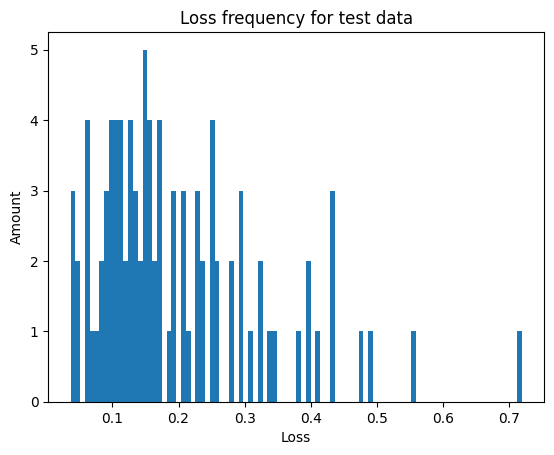

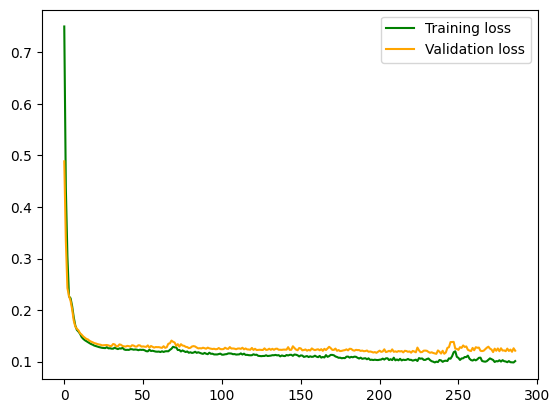

Loss average is: 0.19833700052414002
Loss mode is: [(0.08834, 1), (0.11316, 1), (0.08792, 1), (0.28001, 1), (0.48688, 1), (0.11568, 1), (0.03725, 1), (0.25749, 1), (0.10347, 1), (0.14576, 1)]
Loss median is: 0.15821000000000002
Used time: 21.194573879241943 seconds

3/3 [==============================] - 0s 3ms/step


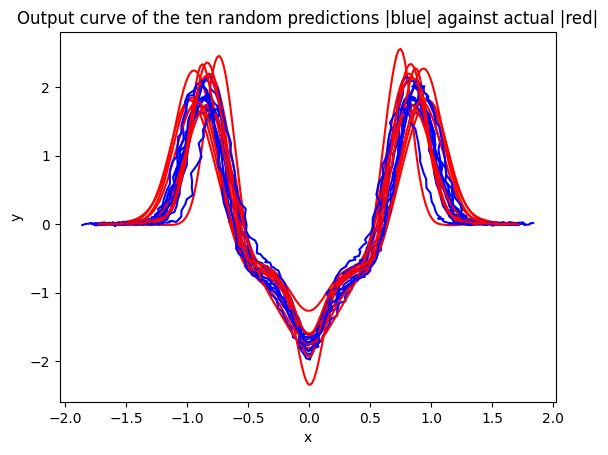

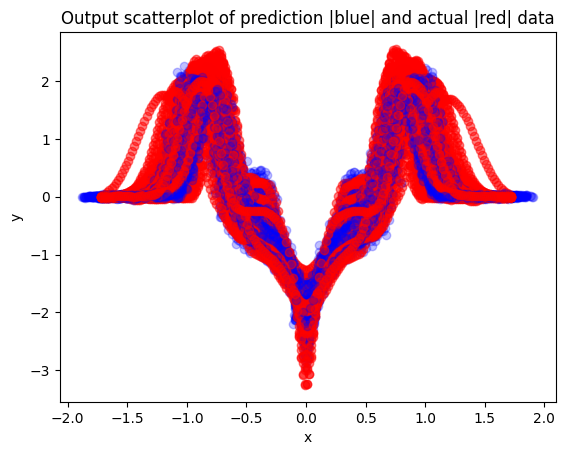

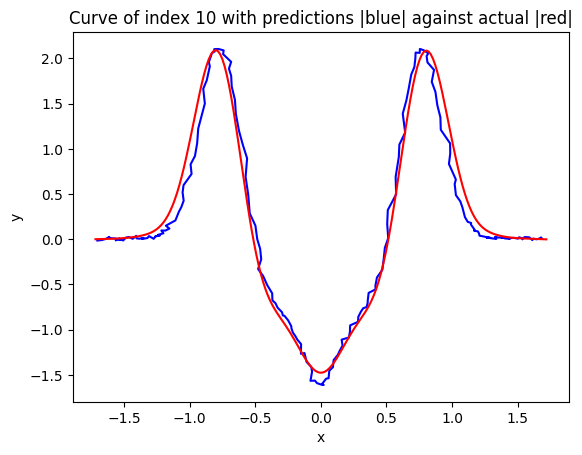

The loss of the curve 0.07701978403656588


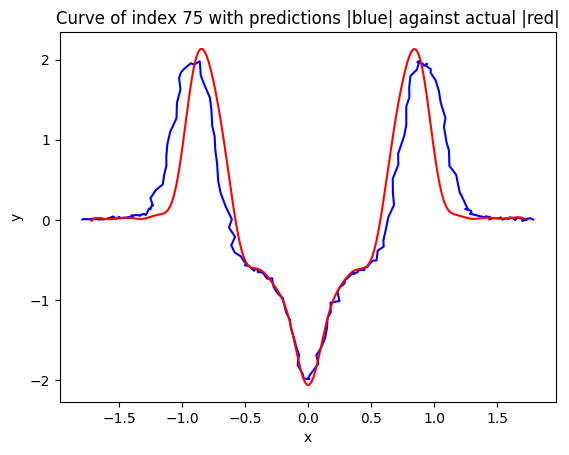

The loss of the curve 0.17132451773175997


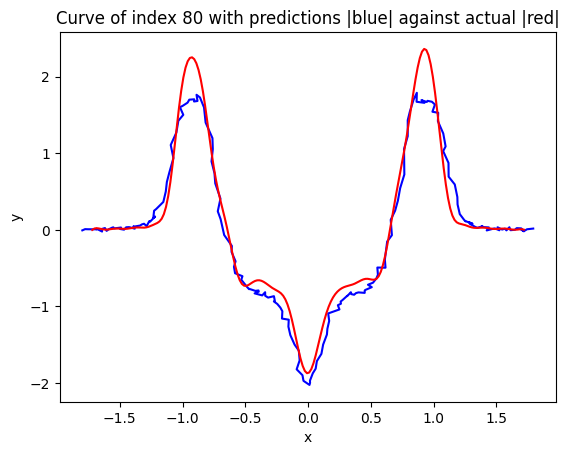

The loss of the curve 0.14949730316232399


In [36]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=50, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(train_input.shape[1],))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dense(1000, activation='relu')(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=158, epochs=500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 7ms/step


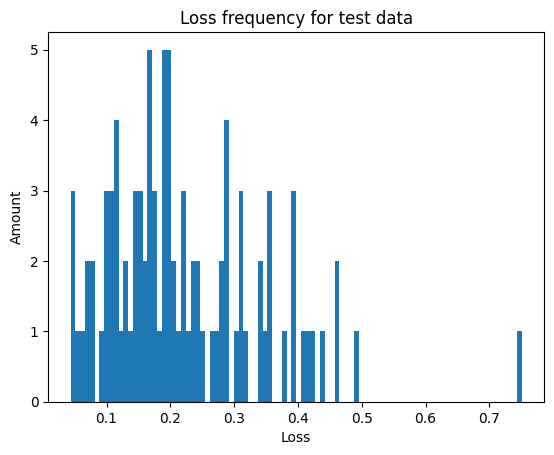

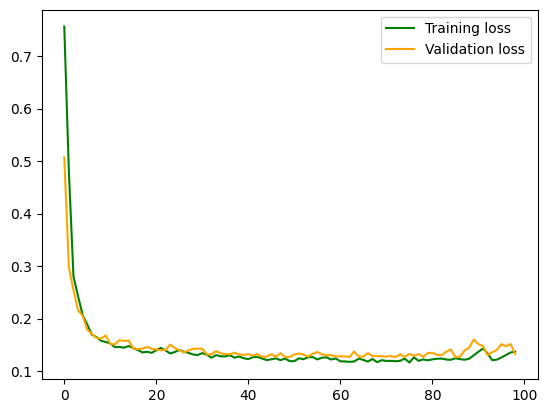

Loss average is: 0.22327200690486895
Loss mode is: [(0.11416, 1), (0.19975, 1), (0.04589, 1), (0.29011, 1), (0.44106, 1), (0.10043, 1), (0.06808, 1), (0.39176, 1), (0.09666, 1), (0.13157, 1)]
Loss median is: 0.19704
Used time: 15.434022903442383 seconds

3/3 [==============================] - 0s 7ms/step


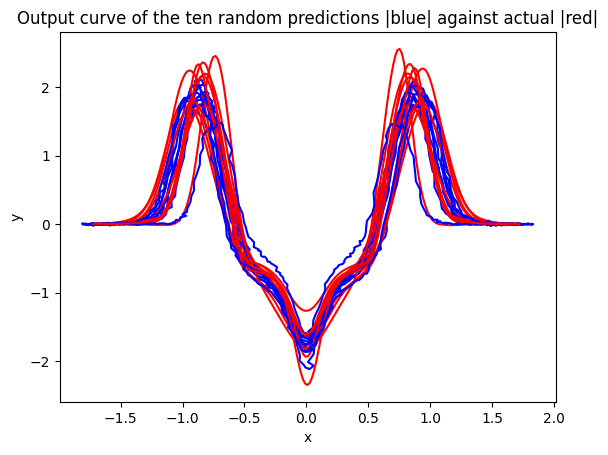

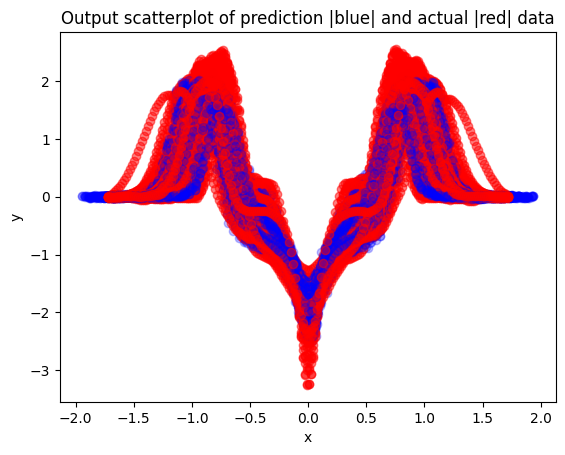

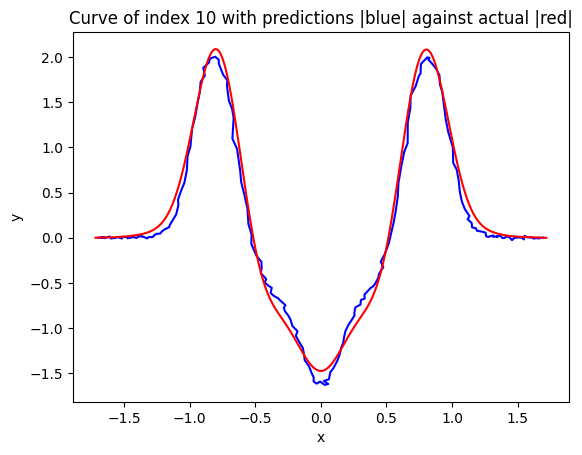

The loss of the curve 0.09808354686735259


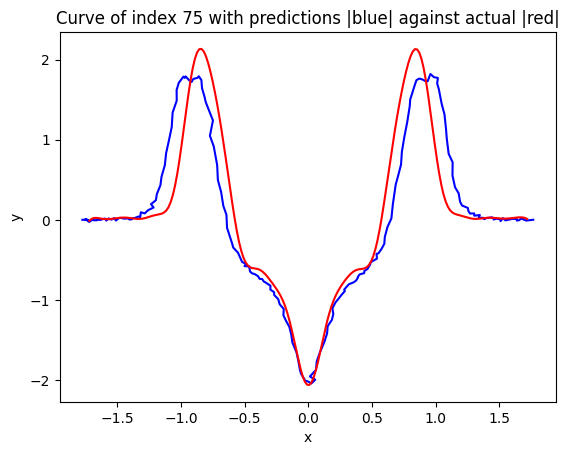

The loss of the curve 0.2008475325813722


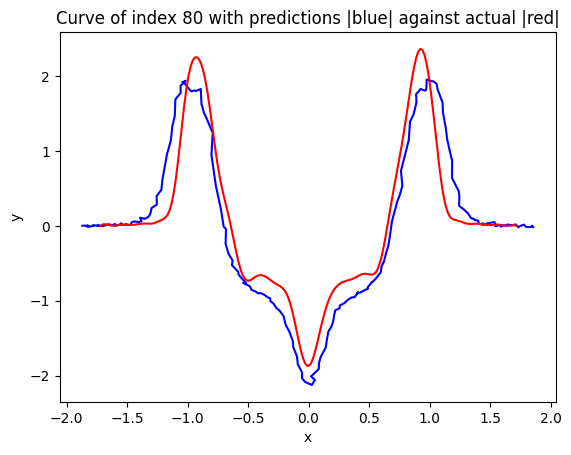

The loss of the curve 0.19159496869905204


In [37]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=50, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(train_input.shape[1],))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dense(1000, activation='relu')(x)
x = layers.Dense(1000, activation='relu')(x)
x = layers.Dense(1000, activation='relu')(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=158, epochs=500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 17ms/step


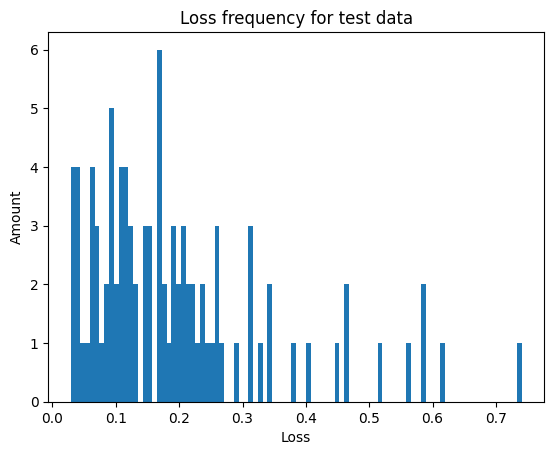

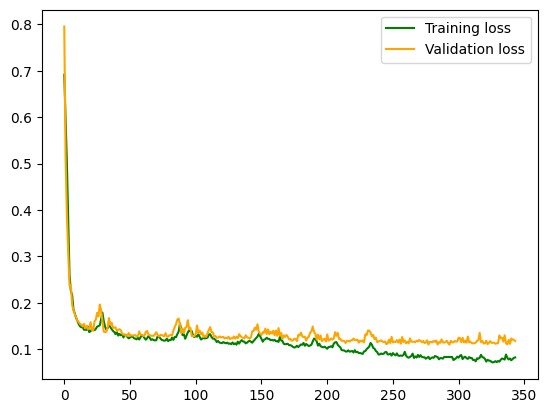

Loss average is: 0.19699577054993472
Loss mode is: [(0.07321, 1), (0.06792, 1), (0.12263, 1), (0.21578, 1), (0.61672, 1), (0.17152, 1), (0.02901, 1), (0.34384, 1), (0.19118, 1), (0.22833, 1)]
Loss median is: 0.165665
Used time: 148.83402299880981 seconds

3/3 [==============================] - 0s 17ms/step


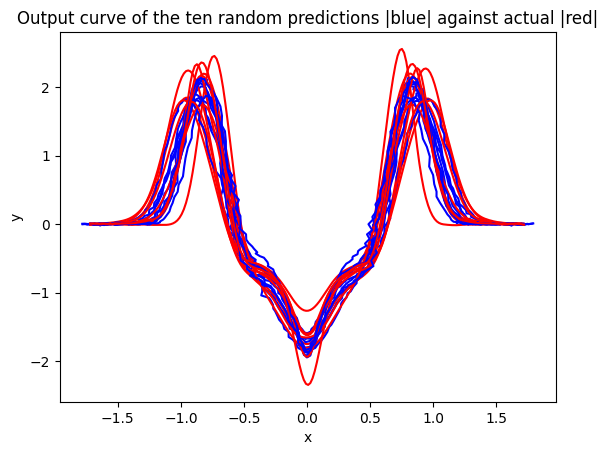

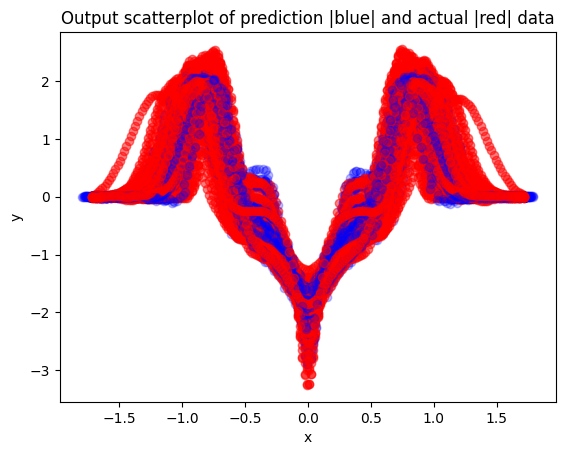

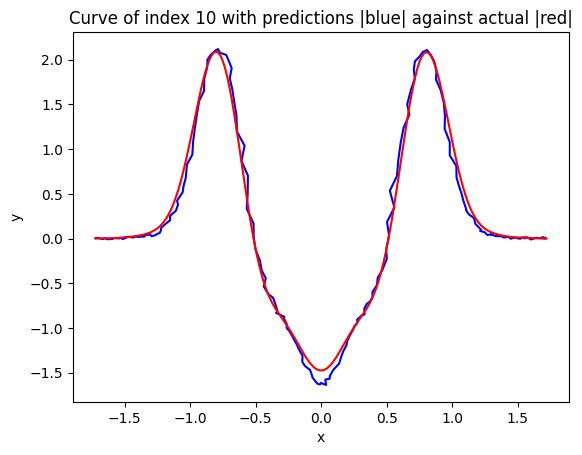

The loss of the curve 0.06443867377166188


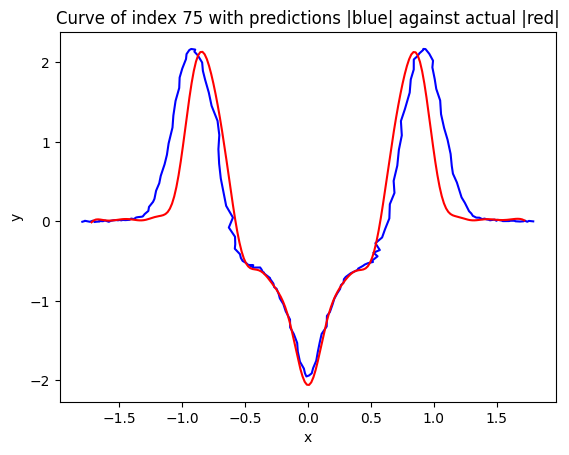

The loss of the curve 0.17951780270661732


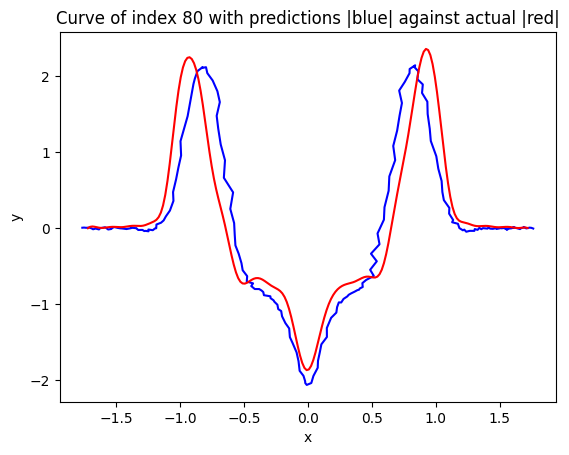

The loss of the curve 0.34664563741222243


In [38]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=50, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(train_input.shape[1],))
x = layers.Dense(2000, activation='relu')(inputs)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dense(2000, activation='relu')(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=158, epochs=500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 19ms/step


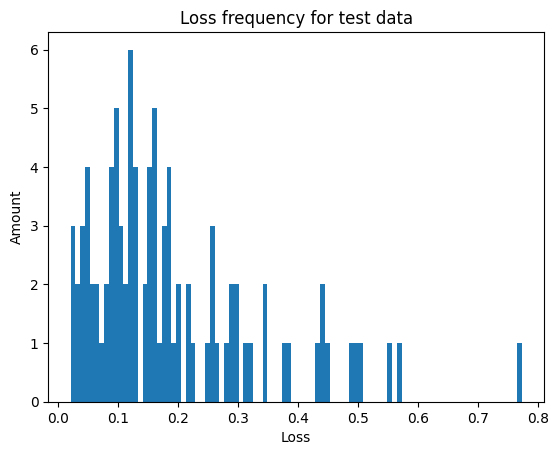

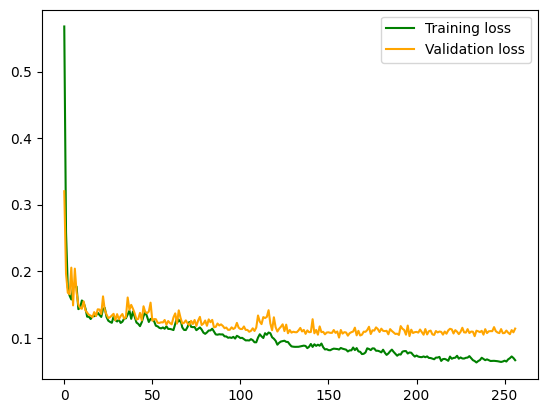

Loss average is: 0.1909656009318272
Loss mode is: [(0.03616, 1), (0.24603, 1), (0.04955, 1), (0.25805, 1), (0.57116, 1), (0.19985, 1), (0.02928, 1), (0.34562, 1), (0.16307, 1), (0.18391, 1)]
Loss median is: 0.154335
Used time: 446.0710229873657 seconds

3/3 [==============================] - 0s 18ms/step


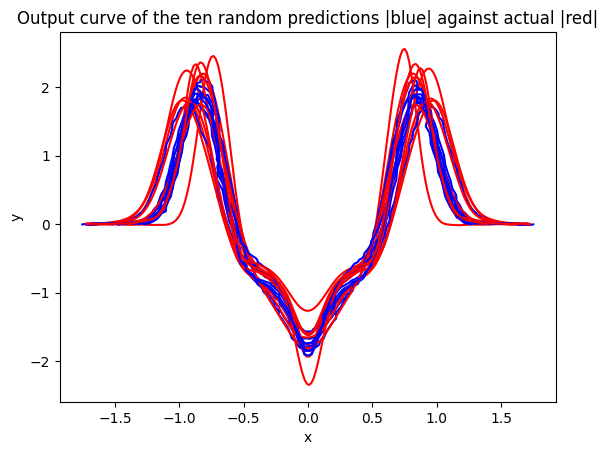

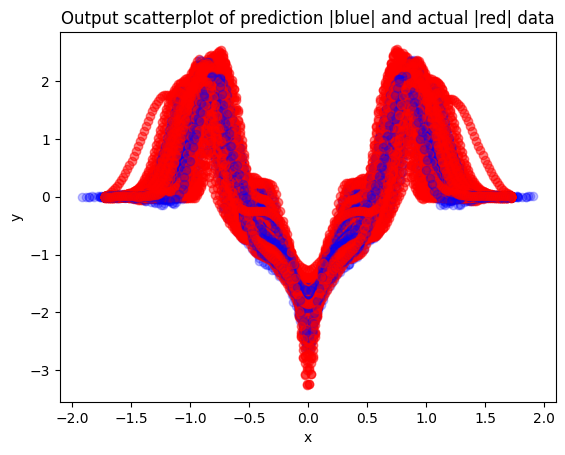

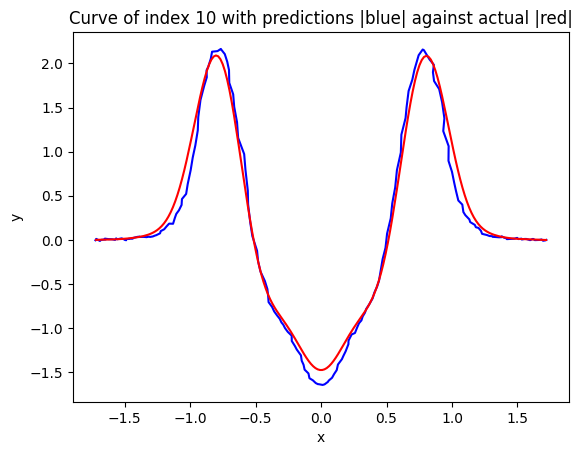

The loss of the curve 0.10994367925066356


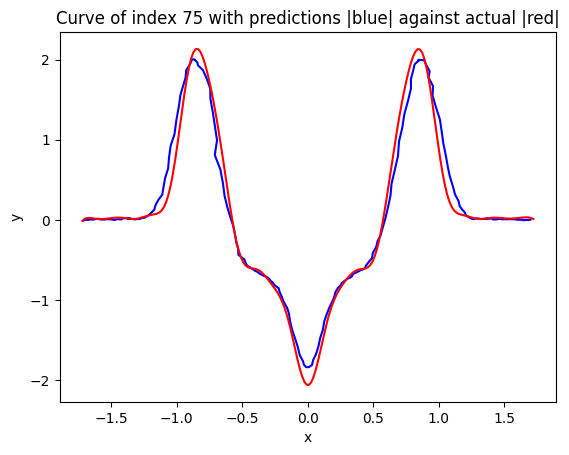

The loss of the curve 0.12213438842036356


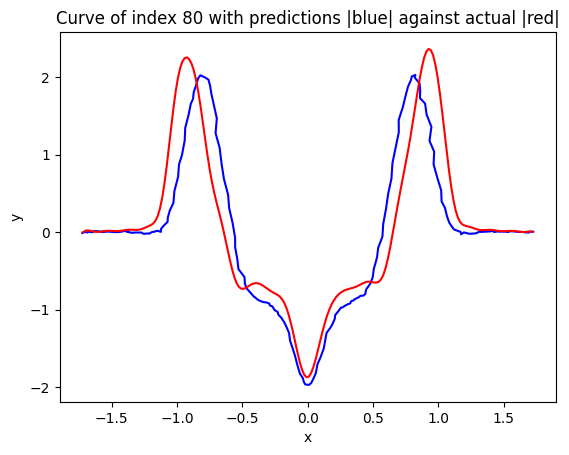

The loss of the curve 0.34623997276186935


In [39]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(train_input.shape[1],))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dense(3000, activation='relu')(x)
x = layers.Dense(3000, activation='relu')(x)
x = layers.Dense(3000, activation='relu')(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=64, epochs=800, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 17ms/step


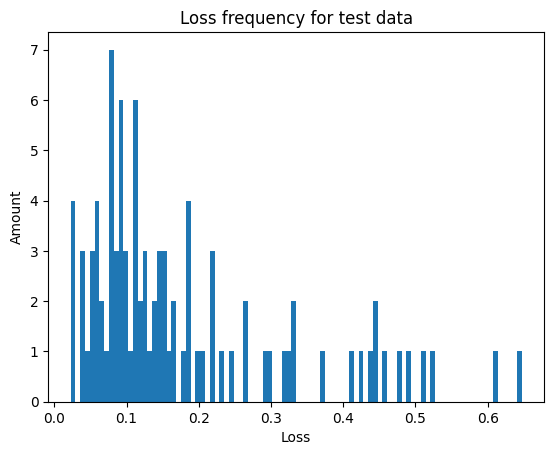

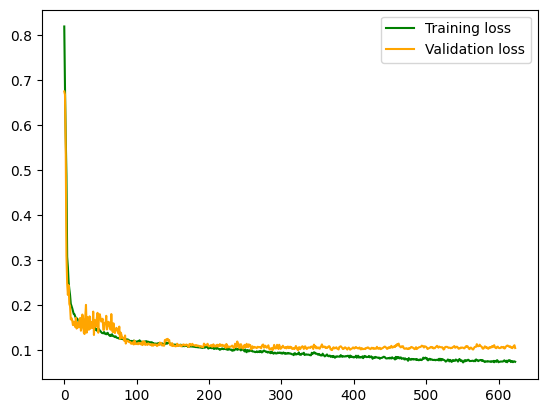

Loss average is: 0.17921345386516424
Loss mode is: [(0.08706, 1), (0.0866, 1), (0.03786, 1), (0.21804, 1), (0.61327, 1), (0.19675, 1), (0.0475, 1), (0.32911, 1), (0.07828, 1), (0.12779, 1)]
Loss median is: 0.12538
Used time: 619.270122051239 seconds

3/3 [==============================] - 0s 17ms/step


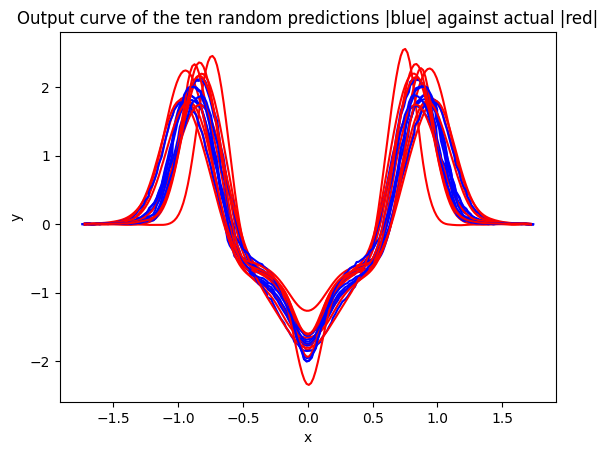

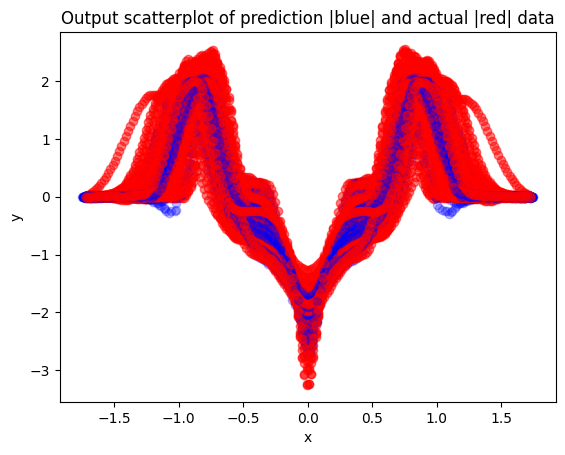

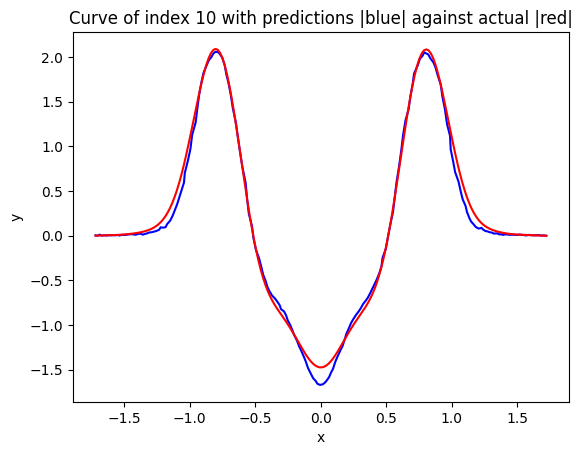

The loss of the curve 0.057078187629716615


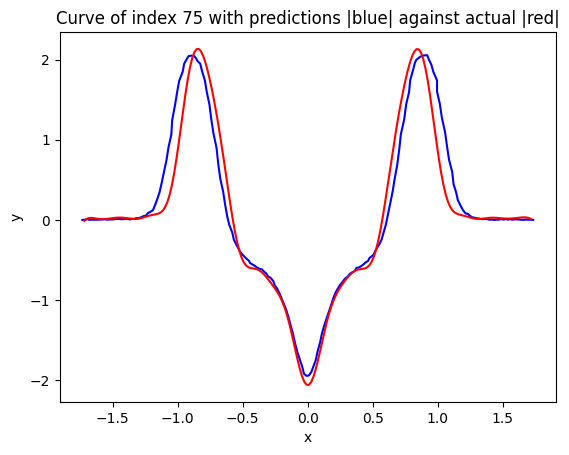

The loss of the curve 0.14778825605121138


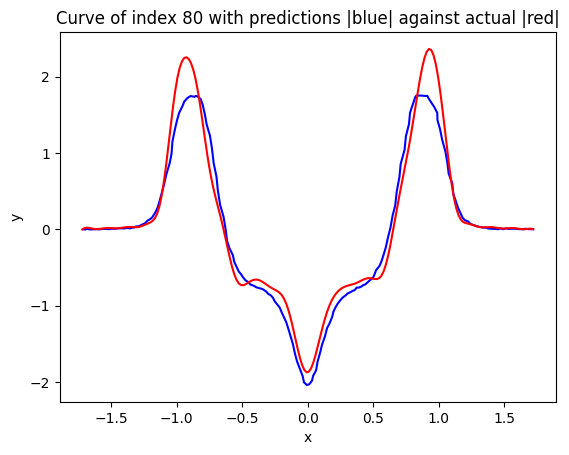

The loss of the curve 0.1498051939673037


In [6]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

Adam = tf.keras.optimizers.Adam(amsgrad=True)

inputs = keras.Input(shape=(train_input.shape[1],))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.2, seed=42)(x)
x = layers.Dense(3000, activation='relu')(x)
x = layers.Dropout(0.2, seed=42)(x)
x = layers.Dense(3000, activation='relu')(x)
x = layers.Dropout(0.2, seed=42)(x)
x = layers.Dense(3000, activation='relu')(x)
x = layers.Dropout(0.2, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=Adam, loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=158, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

In [ ]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=300, 
                       restore_best_weights=True)]

Adam = tf.keras.optimizers.Adam(amsgrad=True)

inputs = keras.Input(shape=(train_input.shape[1],))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.2, seed=42)(x)
x = layers.Dense(3000, activation='relu')(x)
x = layers.Dropout(0.2, seed=42)(x)
x = layers.Dense(3000, activation='relu')(x)
x = layers.Dropout(0.2, seed=42)(x)
x = layers.Dense(3000, activation='relu')(x)
x = layers.Dropout(0.2, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=Adam, loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=158, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

In [32]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=50, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dense(1000, activation='relu')(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=158, epochs=500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

ValueError: in user code:

    File "D:\Users\CellScatter\venv\lib\site-packages\keras\engine\training.py", line 1249, in train_function  *
        return step_function(self, iterator)
    File "D:\Users\CellScatter\venv\lib\site-packages\keras\engine\training.py", line 1233, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "D:\Users\CellScatter\venv\lib\site-packages\keras\engine\training.py", line 1222, in run_step  **
        outputs = model.train_step(data)
    File "D:\Users\CellScatter\venv\lib\site-packages\keras\engine\training.py", line 1023, in train_step
        y_pred = self(x, training=True)
    File "D:\Users\CellScatter\venv\lib\site-packages\keras\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "D:\Users\CellScatter\venv\lib\site-packages\keras\engine\input_spec.py", line 295, in assert_input_compatibility
        raise ValueError(

    ValueError: Input 0 of layer "model" is incompatible with the layer: expected shape=(None, 1000), found shape=(None, 4)


3/3 [==============================] - 0s 9ms/step


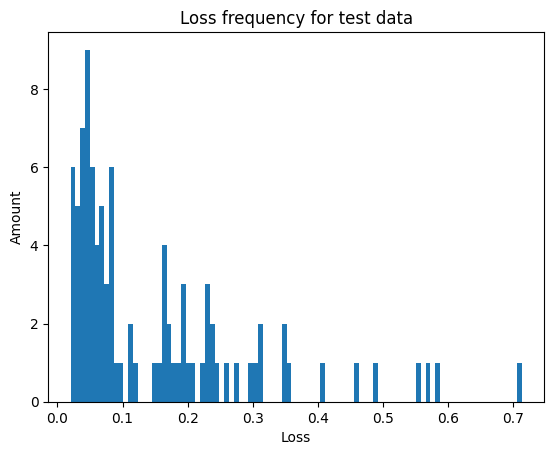

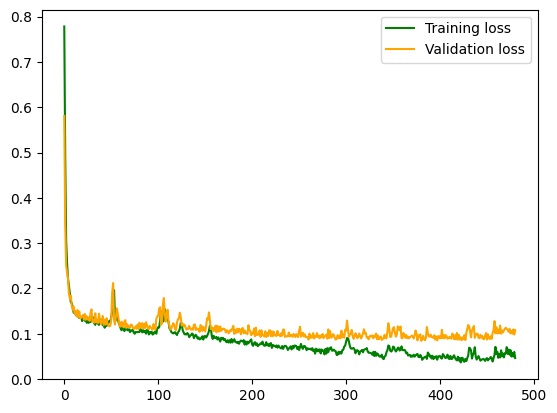

Loss average is: 0.14927835635498157
Loss mode is: [(0.03696, 1), (0.06276, 1), (0.02404, 1), (0.17291, 1), (0.16059, 1), (0.16011, 1), (0.03167, 1), (0.48776, 1), (0.22047, 1), (0.06779, 1)]
Loss median is: 0.082195
Used time: 74.23553442955017 seconds

3/3 [==============================] - 0s 9ms/step


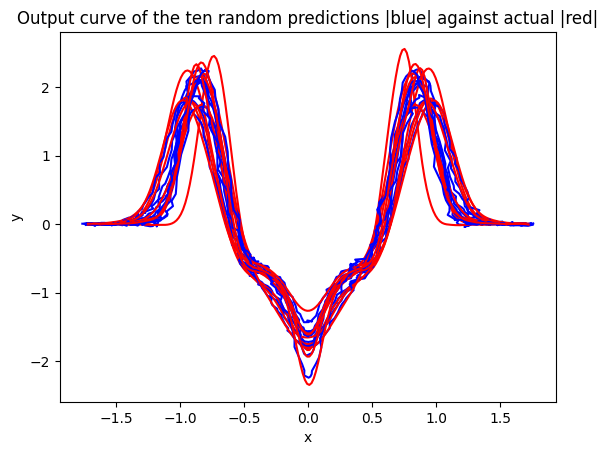

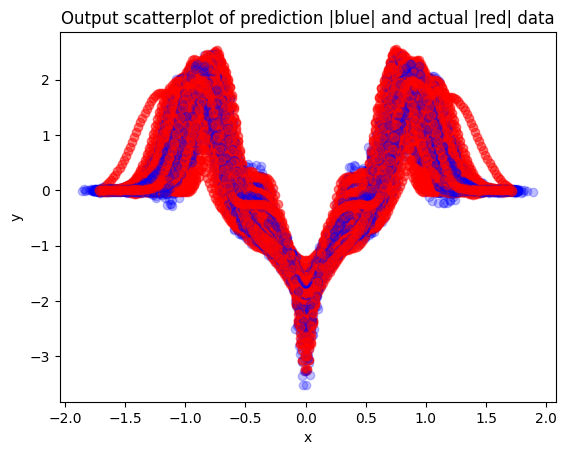

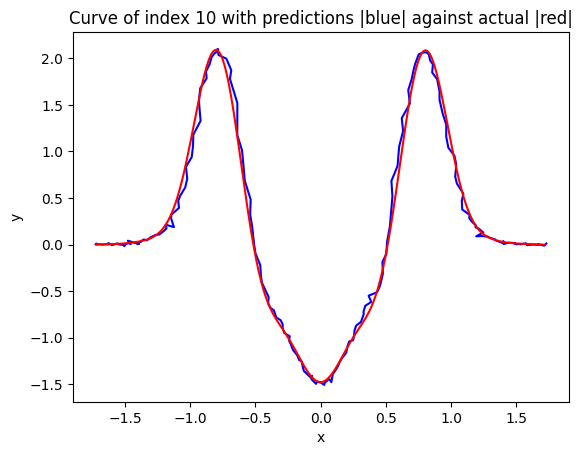

The loss of the curve 0.043621278982552025


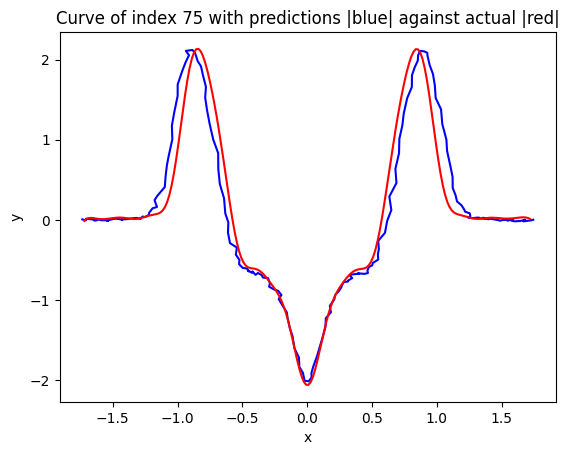

The loss of the curve 0.15238140412971302


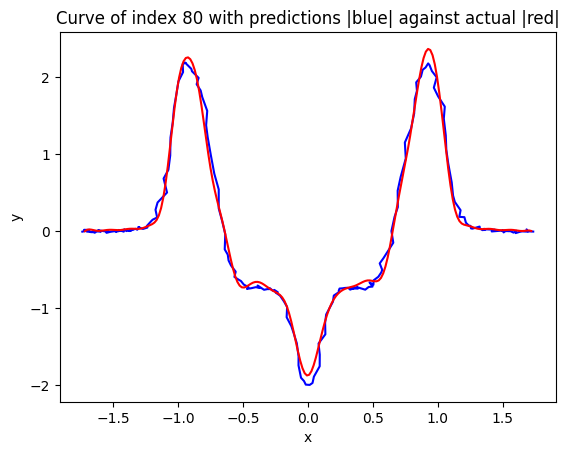

The loss of the curve 0.07509818524228543


In [110]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dense(1000, activation='relu')(x)
x = layers.Dense(1000, activation='relu')(x)
x = layers.Dense(1000, activation='relu')(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=158, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 10ms/step


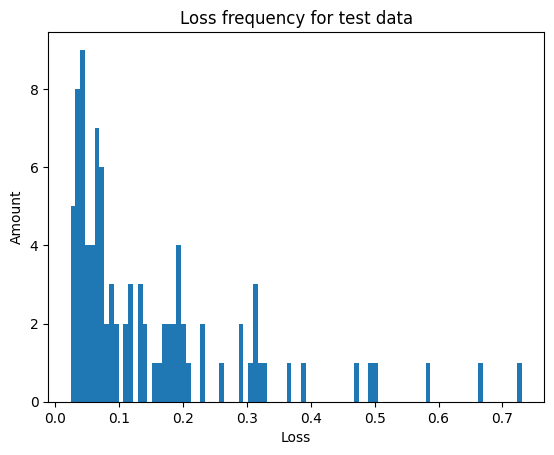

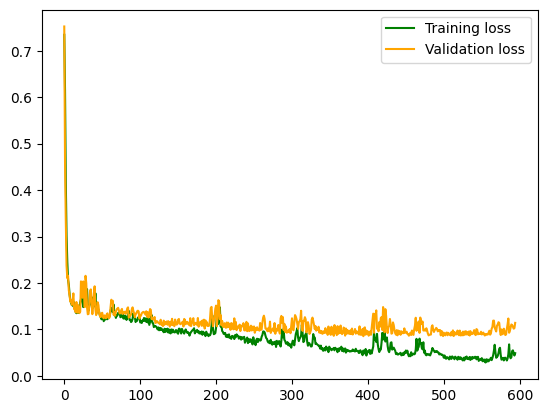

Loss average is: 0.15062836226180323
Loss mode is: [(0.07228, 1), (0.06518, 1), (0.05564, 1), (0.19532, 1), (0.12002, 1), (0.13001, 1), (0.0595, 1), (0.66382, 1), (0.19638, 1), (0.07526, 1)]
Loss median is: 0.089185
Used time: 105.34653615951538 seconds

3/3 [==============================] - 0s 10ms/step


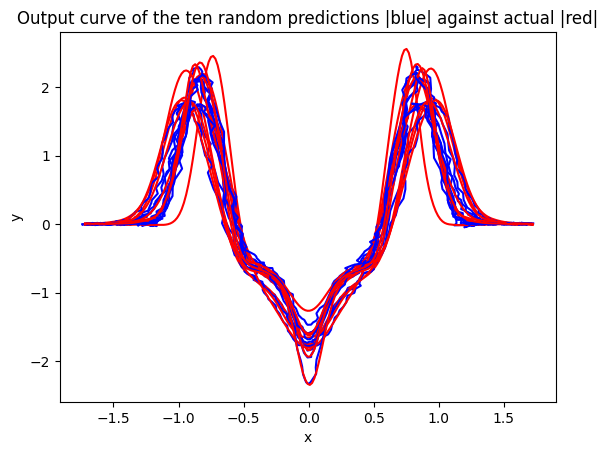

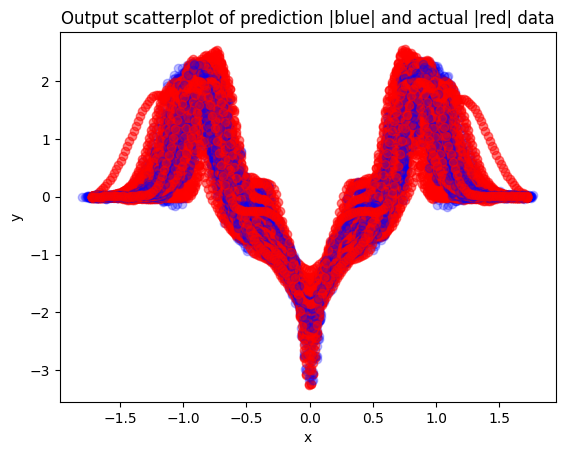

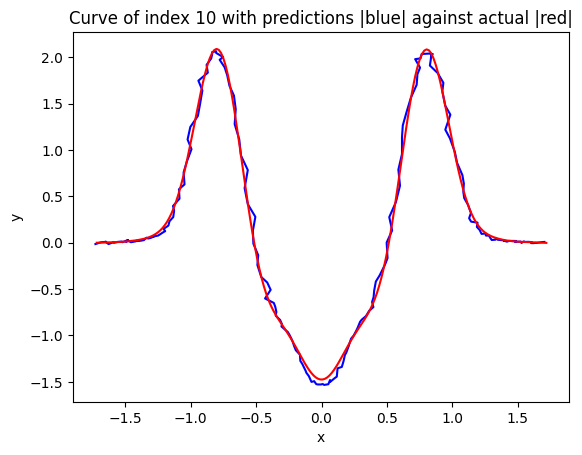

The loss of the curve 0.031052882524657016


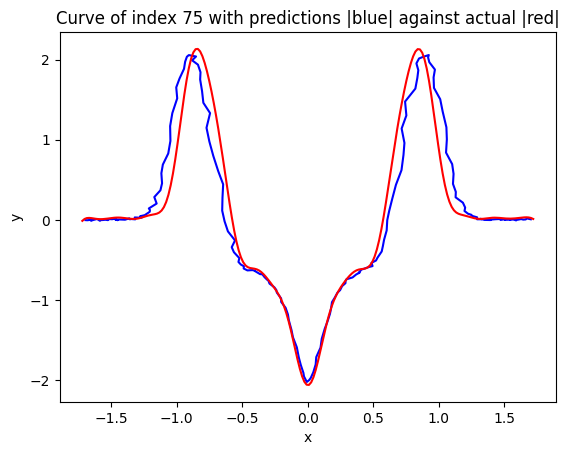

The loss of the curve 0.19898376590810116


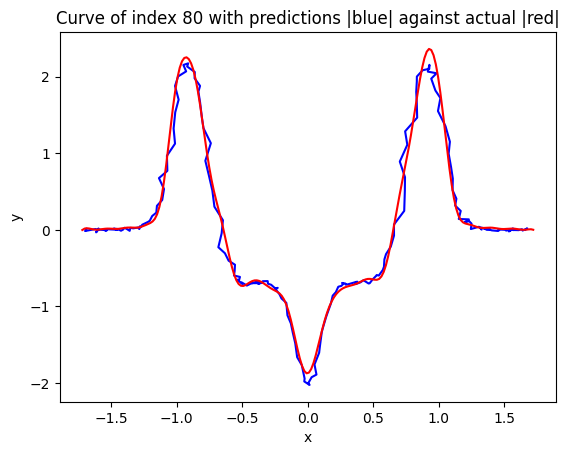

The loss of the curve 0.07470394335200523


In [111]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=200, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dense(1000, activation='relu')(x)
x = layers.Dense(1000, activation='relu')(x)
x = layers.Dense(1000, activation='relu')(x)
x = layers.Dense(1000, activation='relu')(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=158, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 24ms/step


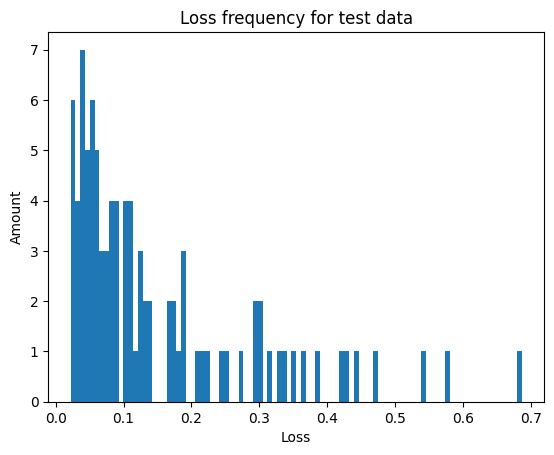

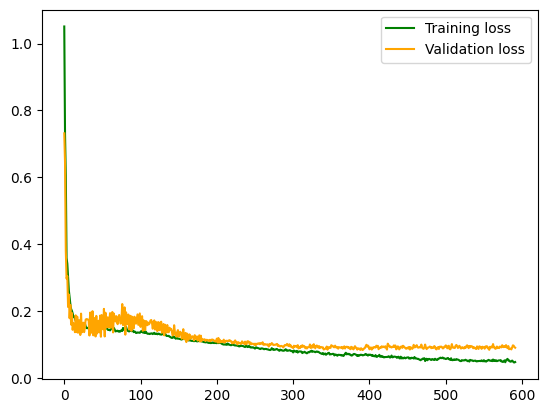

Loss average is: 0.1502112544965186
Loss mode is: [(0.04594, 1), (0.06144, 1), (0.02976, 1), (0.08192, 1), (0.07539, 1), (0.12225, 1), (0.02902, 1), (0.44085, 1), (0.1743, 1), (0.05495, 1)]
Loss median is: 0.09623999999999999
Used time: 350.5454885959625 seconds

3/3 [==============================] - 0s 23ms/step


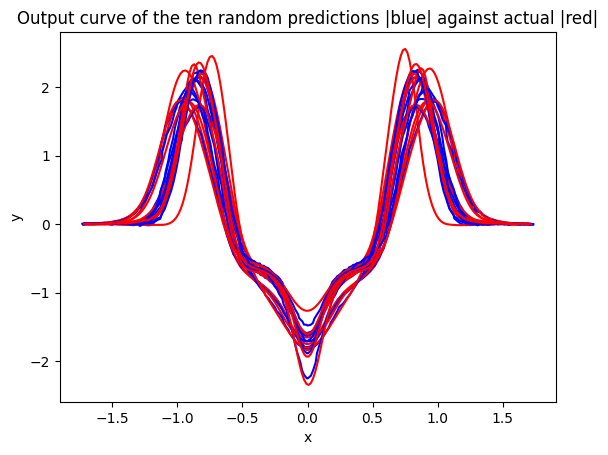

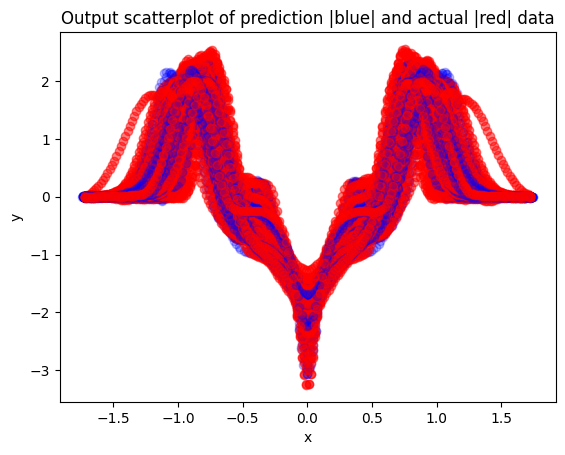

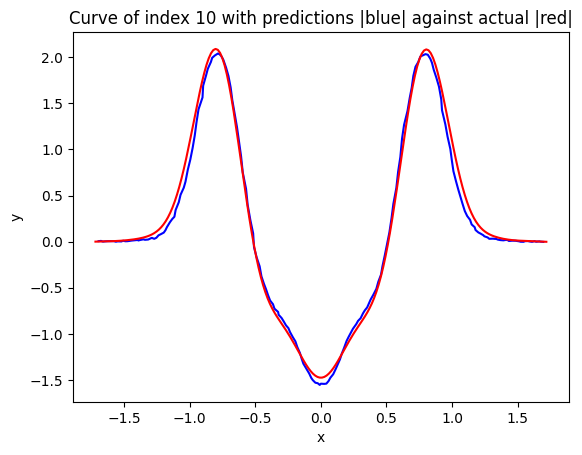

The loss of the curve 0.04426930396193371


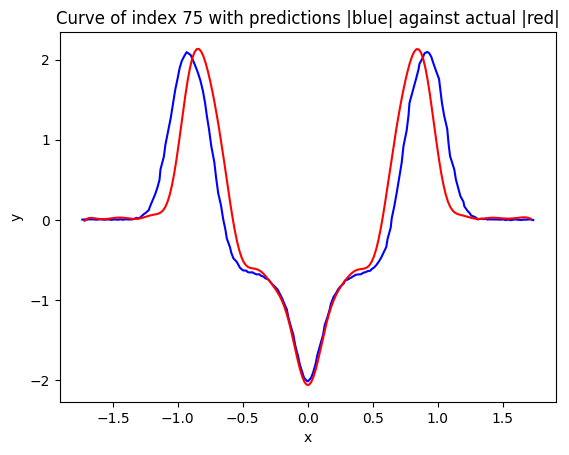

The loss of the curve 0.22671225593968208


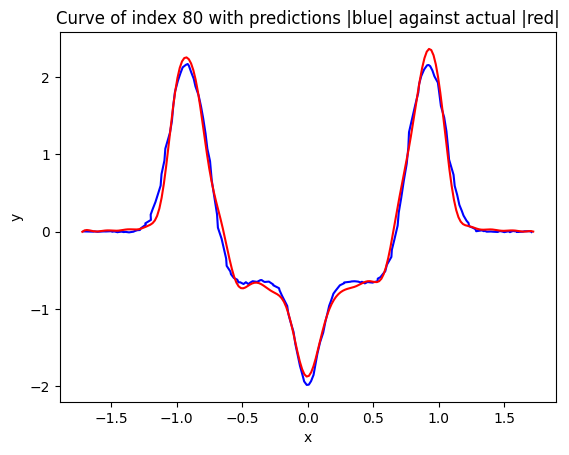

The loss of the curve 0.07646903681239582


In [112]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=200, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(2000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed=42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed=42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed=42)(x)
x = layers.Dense(2000, activation='relu')(x)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=158, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 25ms/step


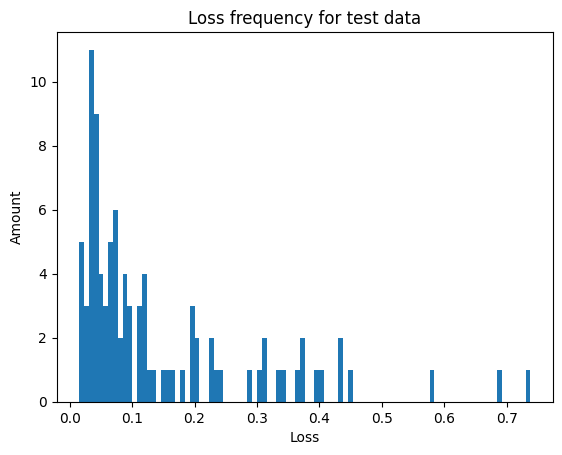

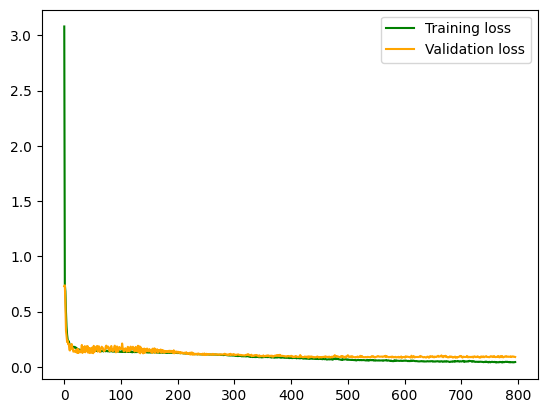

Loss average is: 0.1457933288614205
Loss mode is: [(0.06777, 1), (0.22351, 1), (0.02881, 1), (0.09188, 1), (0.07299, 1), (0.195, 1), (0.05547, 1), (0.73806, 1), (0.20572, 1), (0.09366, 1)]
Loss median is: 0.07793
Used time: 992.1609230041504 seconds

3/3 [==============================] - 0s 22ms/step


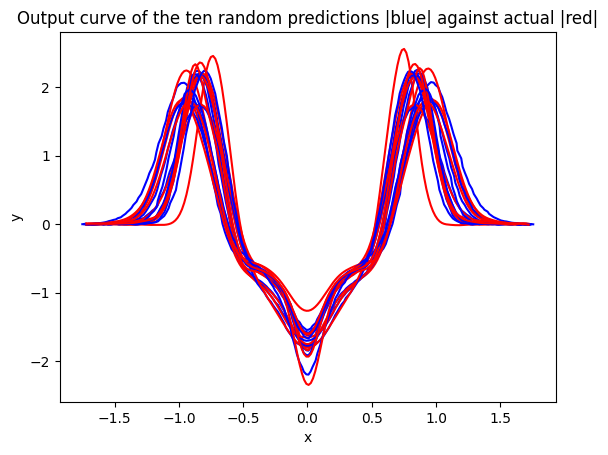

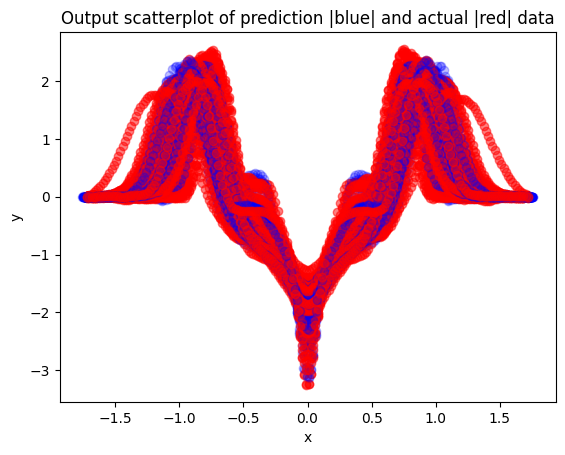

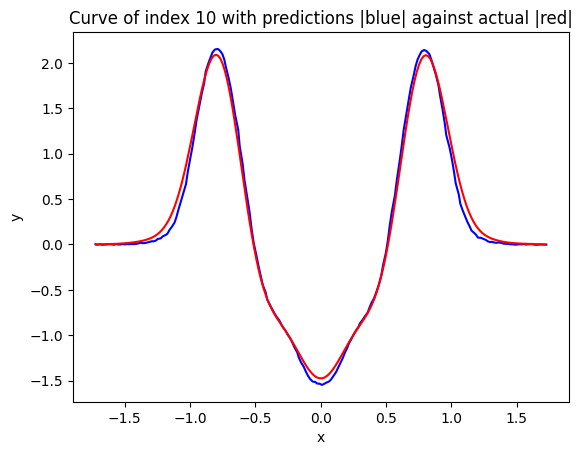

The loss of the curve 0.07360232314856377


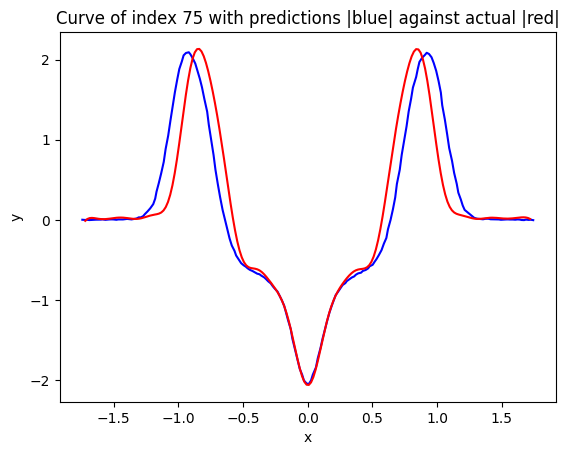

The loss of the curve 0.1985816397253432


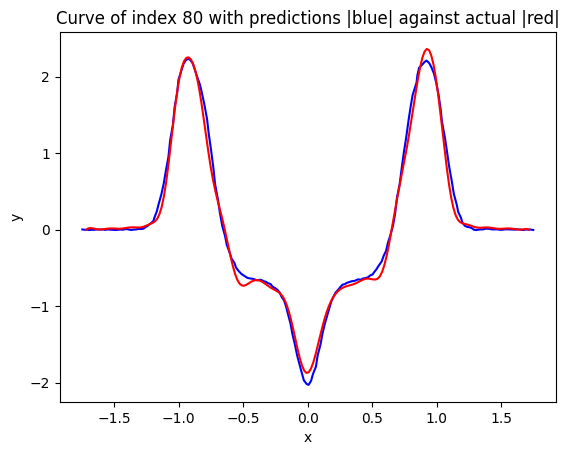

The loss of the curve 0.08829847651381265


In [113]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=200, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
x = layers.Dense(3000, activation='relu')(x)
x = layers.Dropout(0.1, seed=42)(x)
x = layers.Dense(3000, activation='relu')(x)
x = layers.Dropout(0.1, seed=42)(x)
x = layers.Dense(3000, activation='relu')(x)
x = layers.Dropout(0.1, seed=42)(x)
x = layers.Dense(3000, activation='relu')(x)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='mean_absolute_error')

history = model.fit(train_input, train_output, batch_size=158, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 4ms/step


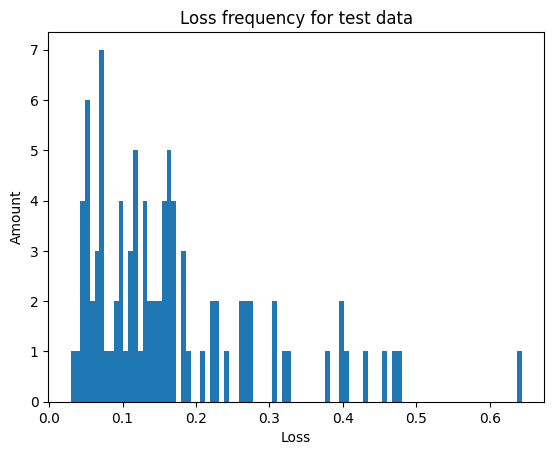

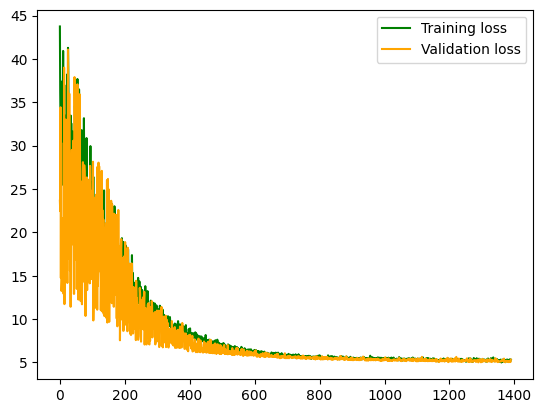

Loss average is: 0.16793944529102936
Loss mode is: [(0.08675, 1), (0.11869, 1), (0.0519, 1), (0.16761, 1), (0.39574, 1), (0.1063, 1), (0.05488, 1), (0.30552, 1), (0.11583, 1), (0.07028, 1)]
Loss median is: 0.13722
Used time: 109.47152423858643 seconds

3/3 [==============================] - 0s 4ms/step


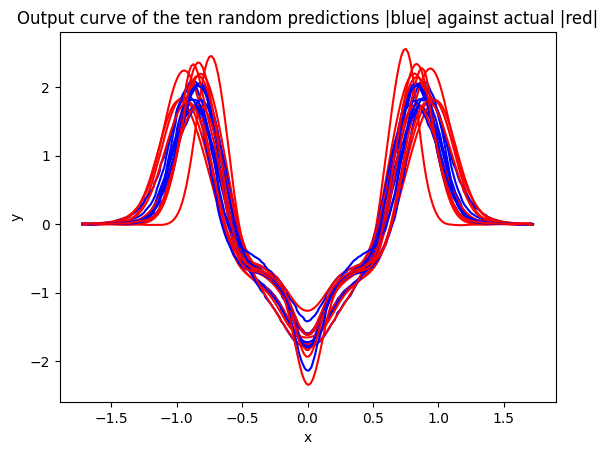

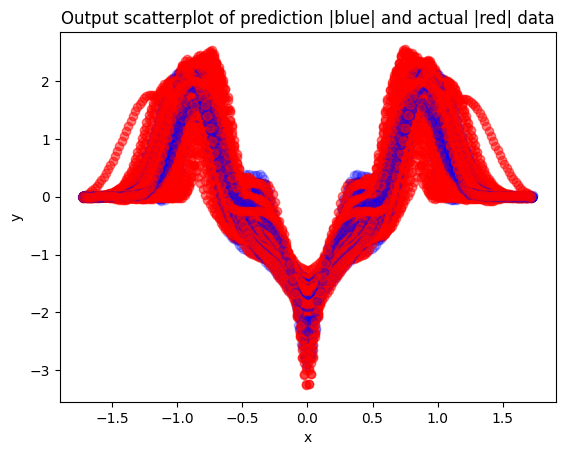

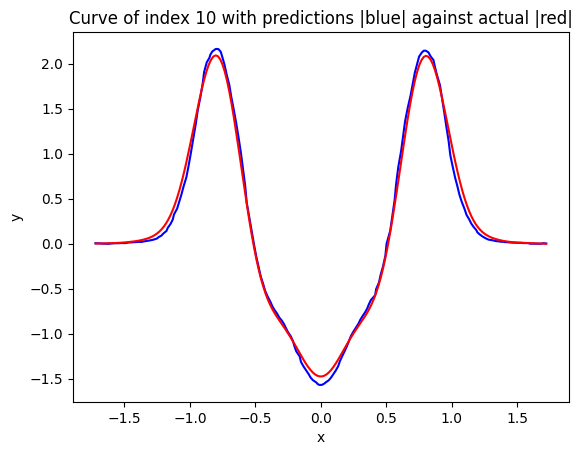

The loss of the curve 0.052674790898452006


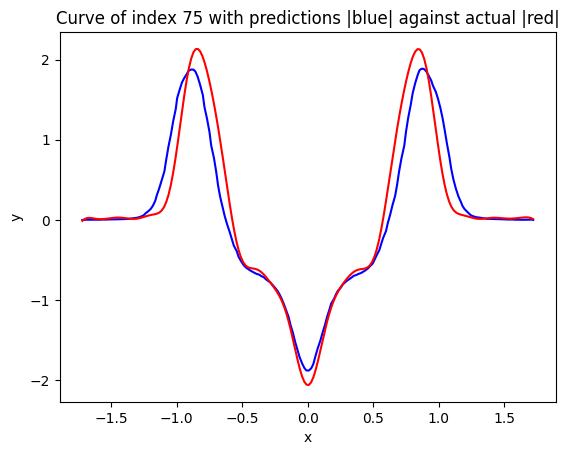

The loss of the curve 0.18427869768694877


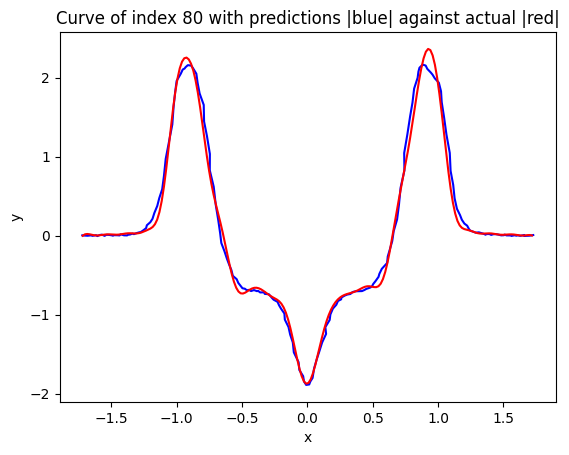

The loss of the curve 0.06486388501697517


In [20]:
import tensorflow.keras.backend as K
import tensorflow_probability as tfp

def kl_divergence_loss(y_true, y_pred):
    reference_distribution = tfp.distributions.Normal(loc=y_true, scale=1.)
    model_distribution = tfp.distributions.Normal(loc=y_pred, scale=1.)
    kl_divergence = tfp.distributions.kl_divergence(reference_distribution, model_distribution)
    kl_loss = K.mean(kl_divergence)
    return kl_loss + K.binary_crossentropy(y_true, y_pred)

general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.MeanAbsoluteError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 6ms/step


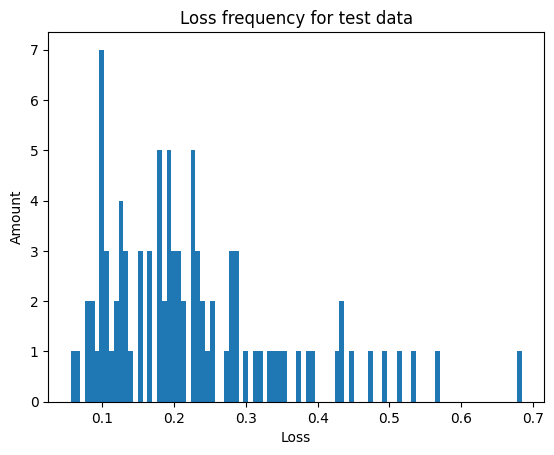

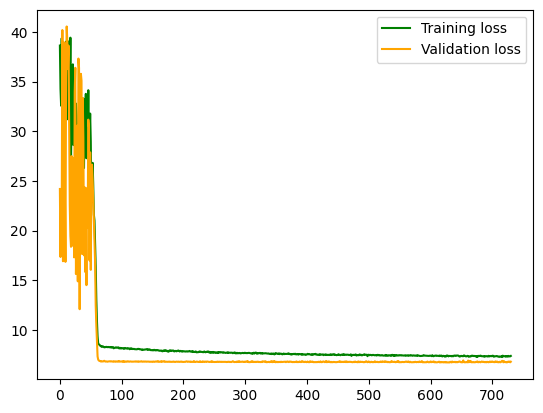

Loss average is: 0.22633489116828093
Loss mode is: [(0.10006, 1), (0.21174, 1), (0.11821, 1), (0.28703, 1), (0.43284, 1), (0.08093, 1), (0.10162, 1), (0.56916, 1), (0.15547, 1), (0.1997, 1)]
Loss median is: 0.19791
Used time: 69.64149832725525 seconds

3/3 [==============================] - 0s 5ms/step


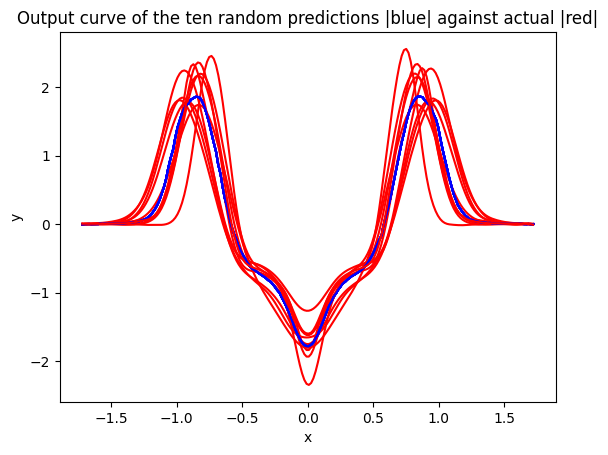

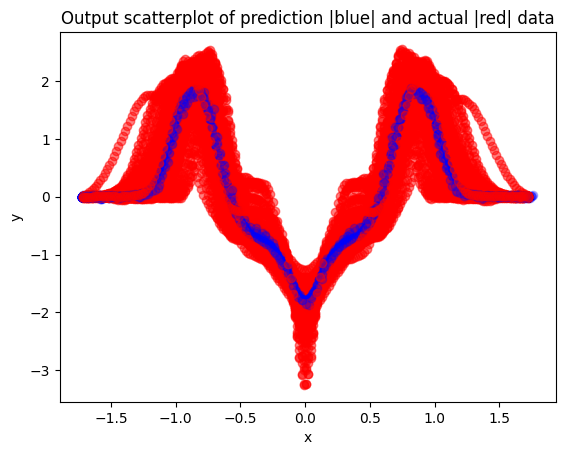

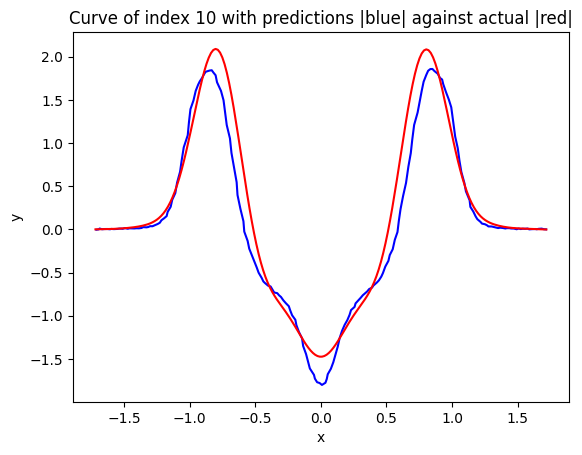

The loss of the curve 0.1666925614003974


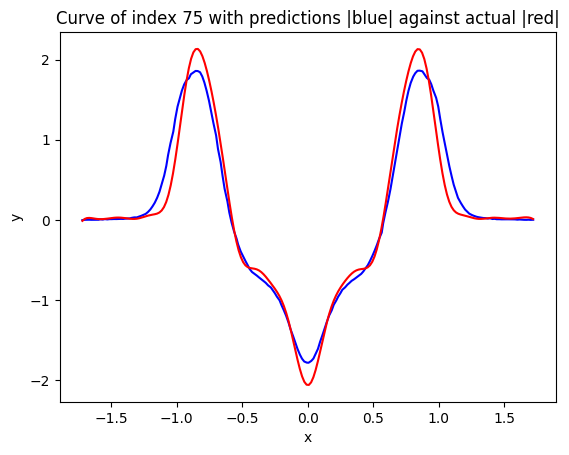

The loss of the curve 0.1279890318938916


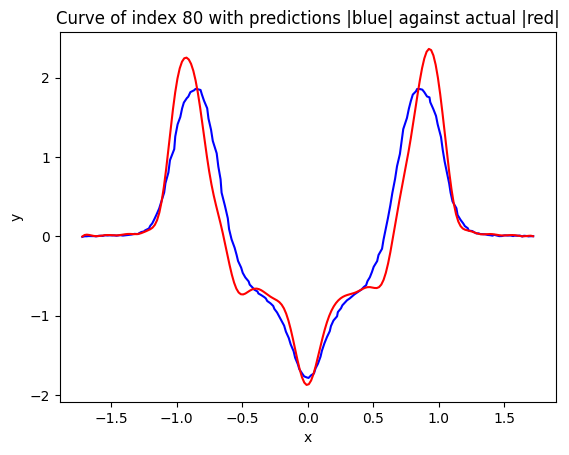

The loss of the curve 0.19307517713324174


In [21]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
x = layers.Dense(1000, activation='relu')(x)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.MeanAbsoluteError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 5ms/step


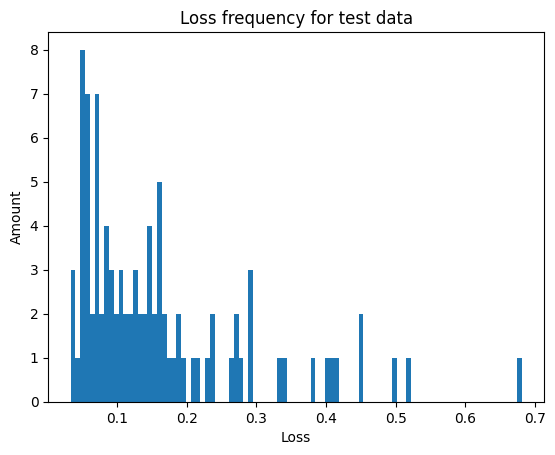

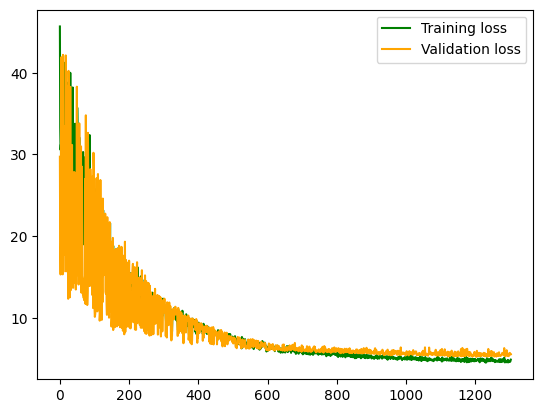

Loss average is: 0.16138063671462388
Loss mode is: [(0.0488, 1), (0.06841, 1), (0.03502, 1), (0.45033, 1), (0.41668, 1), (0.14747, 1), (0.05476, 1), (0.33564, 1), (0.09355, 1), (0.07709, 1)]
Loss median is: 0.12487500000000001
Used time: 122.40856218338013 seconds

3/3 [==============================] - 0s 5ms/step


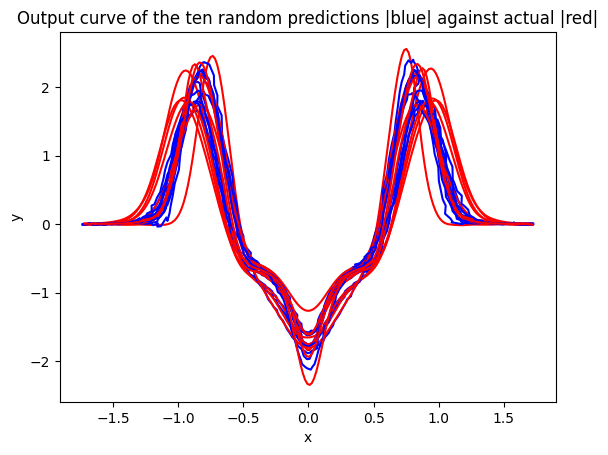

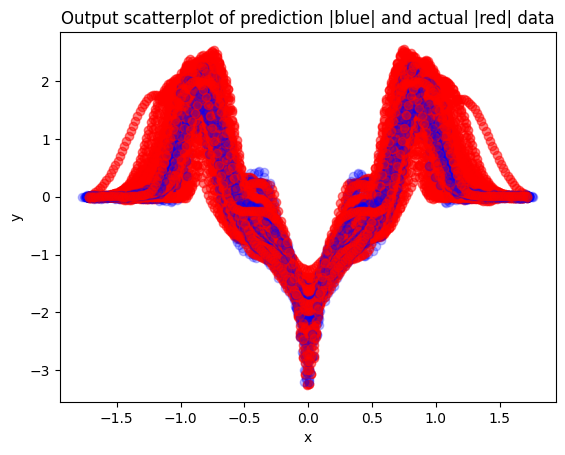

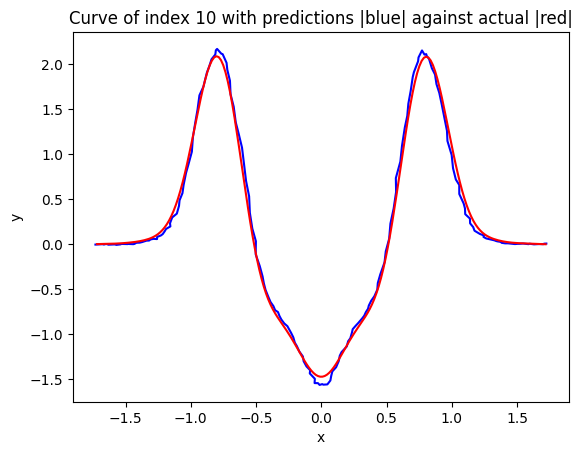

The loss of the curve 0.05789065042232531


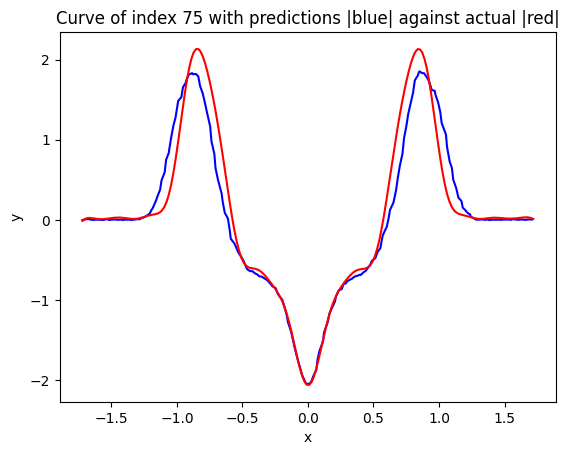

The loss of the curve 0.16072730112731157


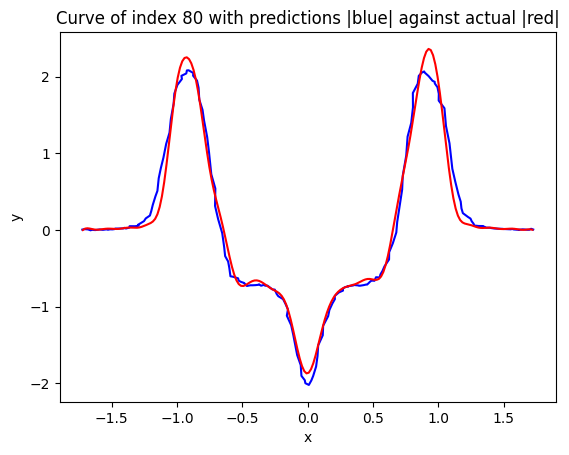

The loss of the curve 0.0881320915651401


In [22]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(2000, activation='relu')(inputs)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.MeanAbsoluteError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 5ms/step


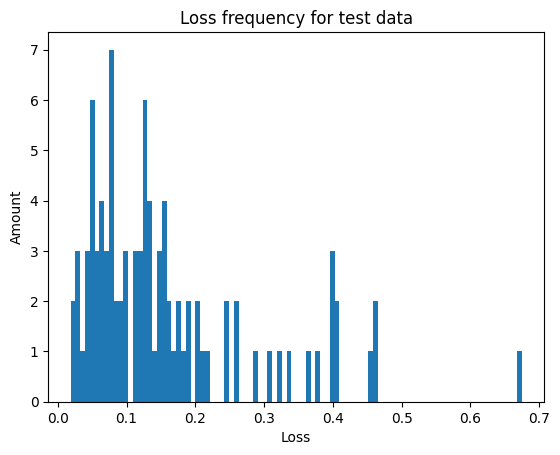

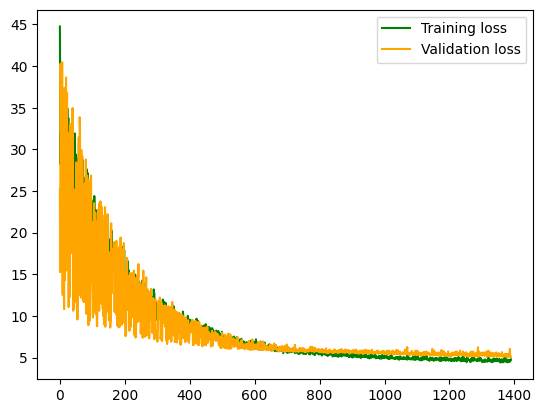

Loss average is: 0.15870434469301595
Loss mode is: [(0.04182, 1), (0.12832, 1), (0.01873, 1), (0.39834, 1), (0.40224, 1), (0.13409, 1), (0.03614, 1), (0.40048, 1), (0.09007, 1), (0.08657, 1)]
Loss median is: 0.124365
Used time: 161.1315357685089 seconds

3/3 [==============================] - 0s 5ms/step


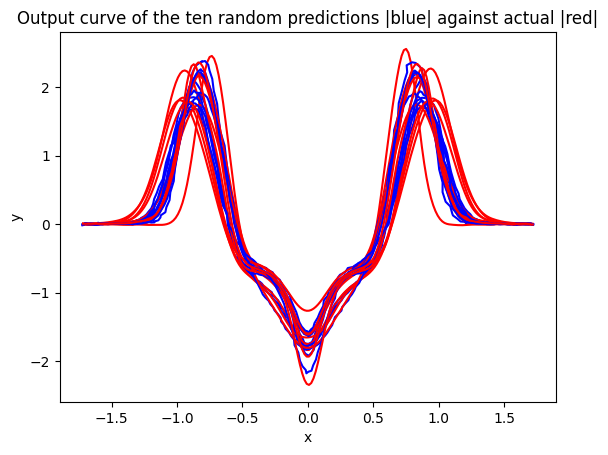

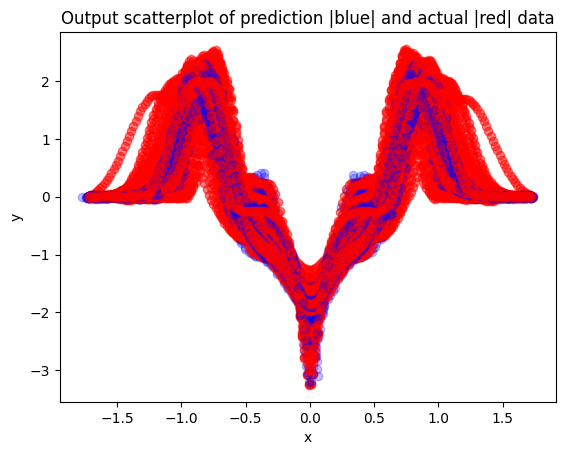

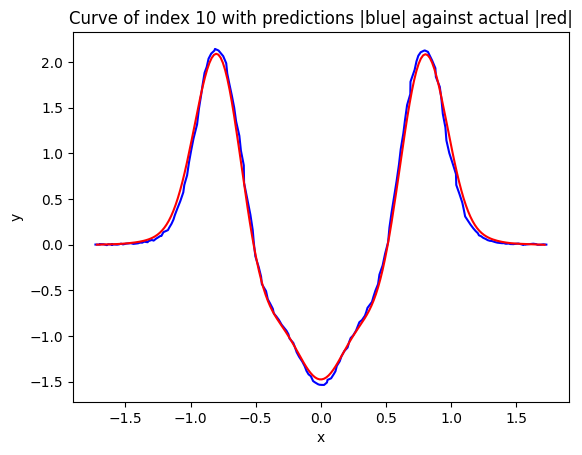

The loss of the curve 0.04858412209443658


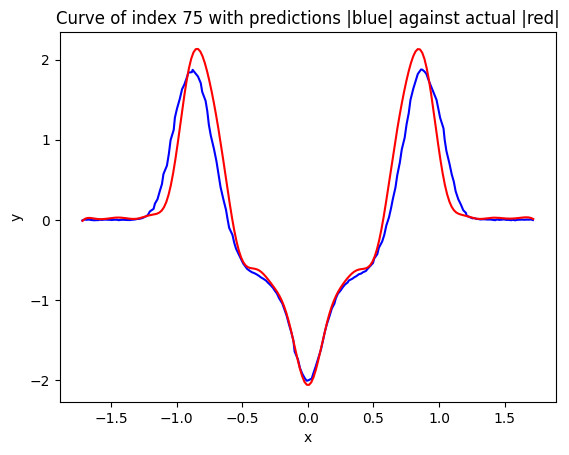

The loss of the curve 0.15247410163113495


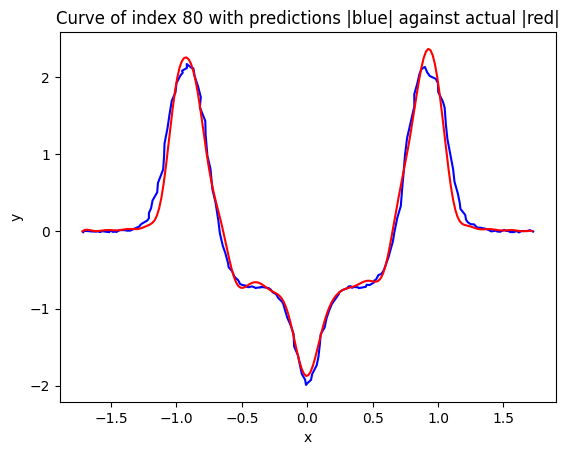

The loss of the curve 0.0819171064860102


In [23]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.MeanAbsoluteError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 5ms/step


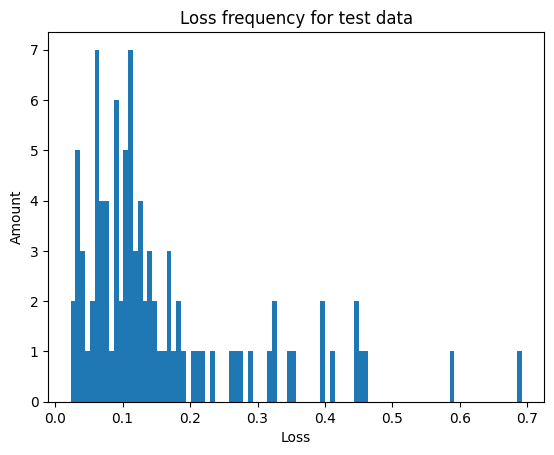

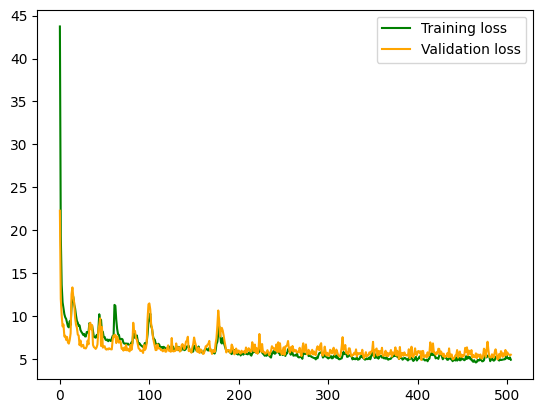

Loss average is: 0.1591864318460485
Loss mode is: [(0.07642, 1), (0.12634, 1), (0.02307, 1), (0.32347, 1), (0.45642, 1), (0.18117, 1), (0.06983, 1), (0.58709, 1), (0.11253, 1), (0.10216, 1)]
Loss median is: 0.11381
Used time: 162.38899755477905 seconds

3/3 [==============================] - 0s 4ms/step


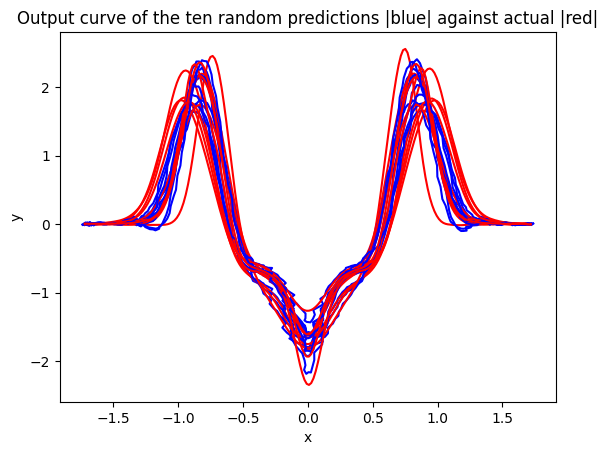

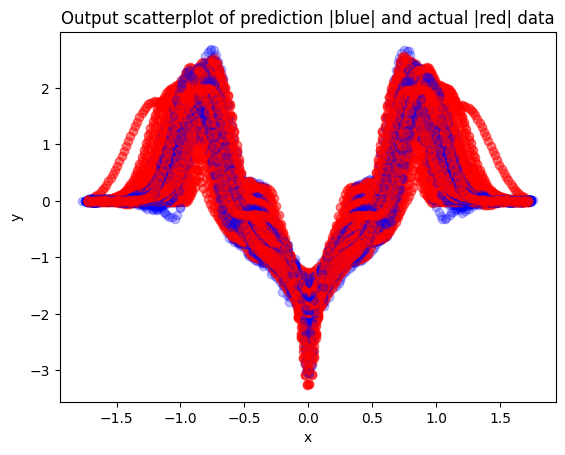

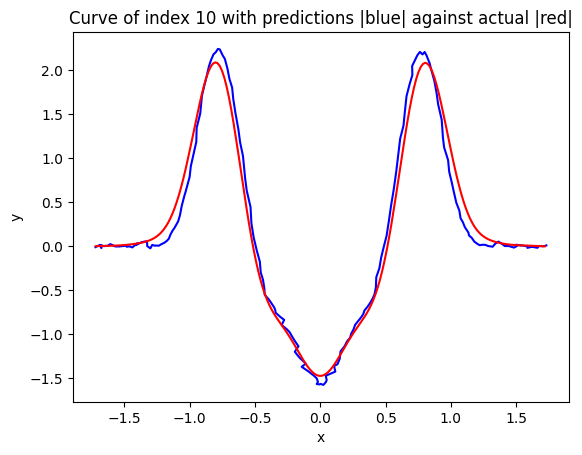

The loss of the curve 0.11161663202746219


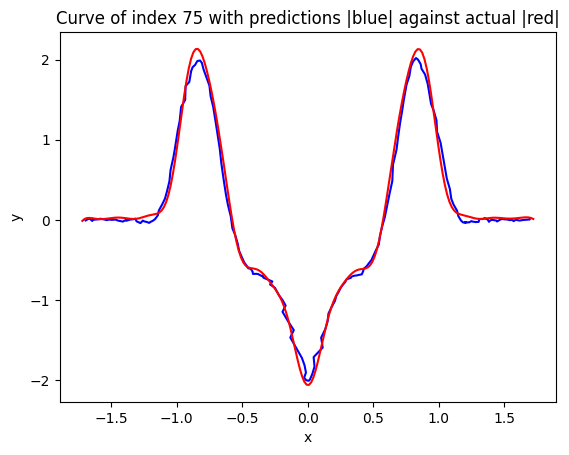

The loss of the curve 0.0904584968273228


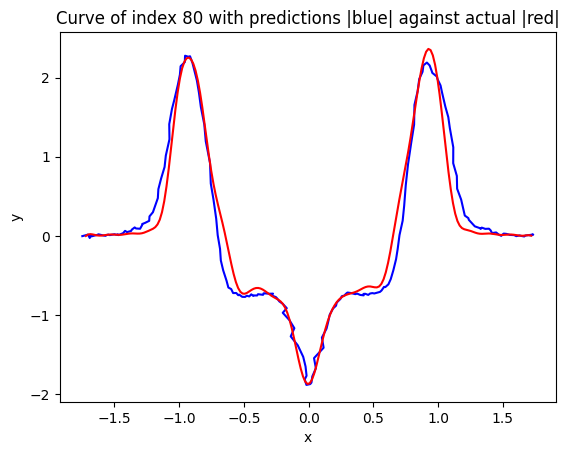

The loss of the curve 0.11296258592111362


In [26]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(3000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.Adam(amsgrad=True), loss=tf.keras.losses.MeanAbsoluteError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 5ms/step


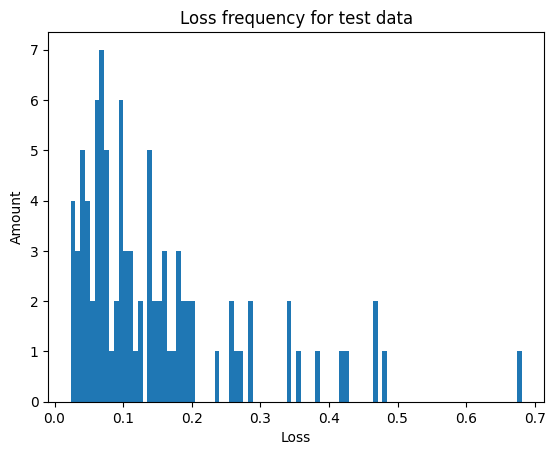

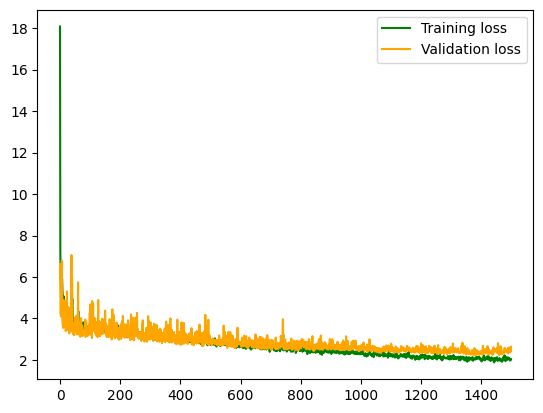

Loss average is: 0.14751899696565005
Loss mode is: [(0.10539, 1), (0.06708, 1), (0.02353, 1), (0.14266, 1), (0.35733, 1), (0.11376, 1), (0.147, 1), (0.48368, 1), (0.09763, 1), (0.06871, 1)]
Loss median is: 0.105185
Used time: 1136.9374771118164 seconds

3/3 [==============================] - 0s 5ms/step


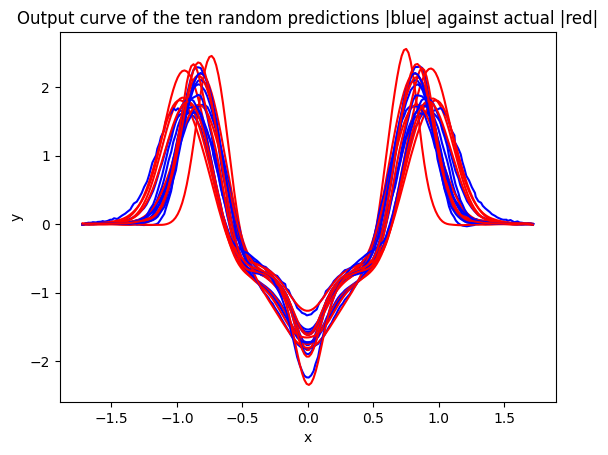

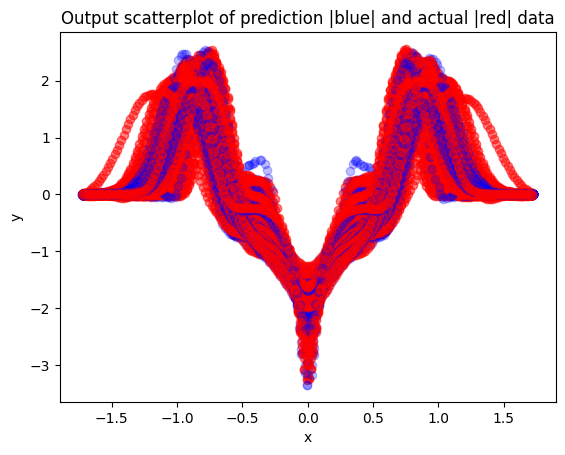

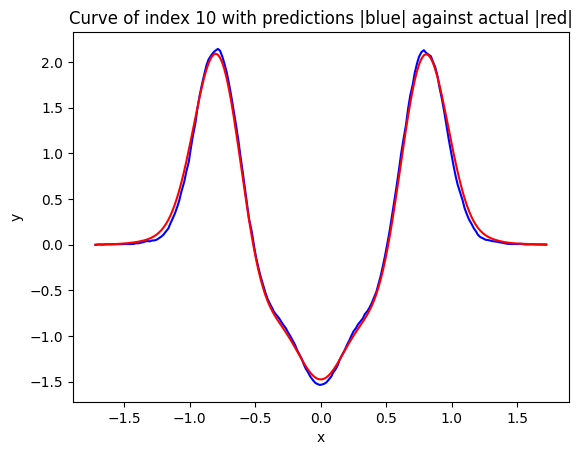

The loss of the curve 0.042352067153626764


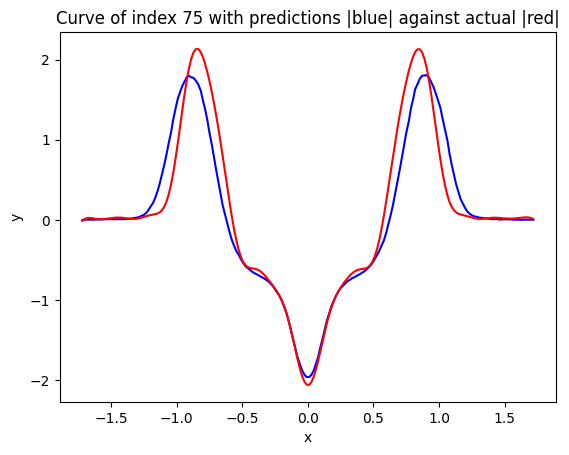

The loss of the curve 0.18537634214542972


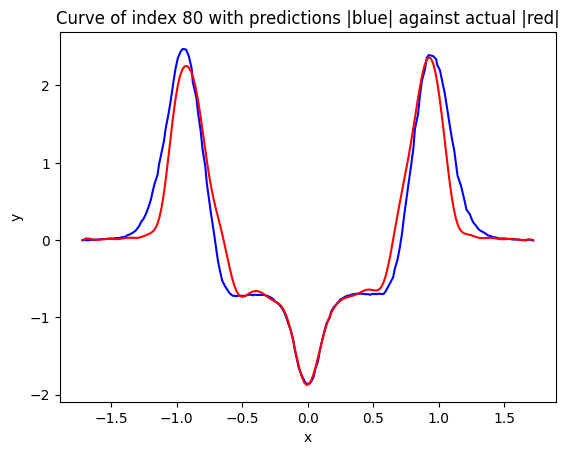

The loss of the curve 0.16391727595731403


In [27]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=200, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(4000, activation='relu')(inputs)
x = layers.Dropout(0.2, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.Adam(amsgrad=True), loss=tf.keras.losses.MeanAbsoluteError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=32, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 4ms/step


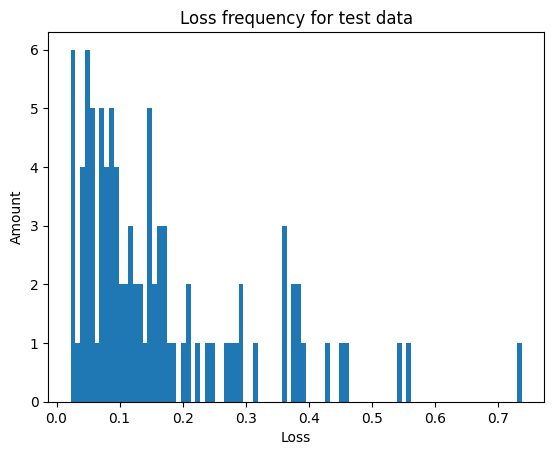

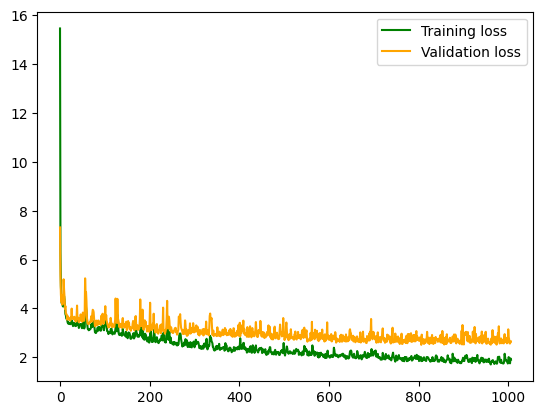

Loss average is: 0.1654070265240151
Loss mode is: [(0.03853, 1), (0.12576, 1), (0.09616, 1), (0.36141, 1), (0.43034, 1), (0.14603, 1), (0.04744, 1), (0.38169, 1), (0.16657, 1), (0.08304, 1)]
Loss median is: 0.11742
Used time: 119.05399894714355 seconds

3/3 [==============================] - 0s 3ms/step


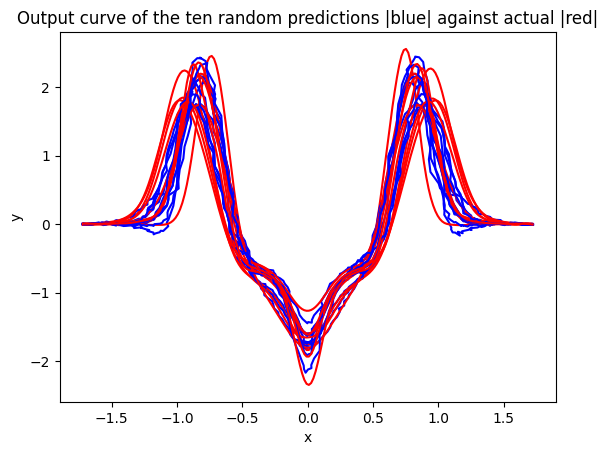

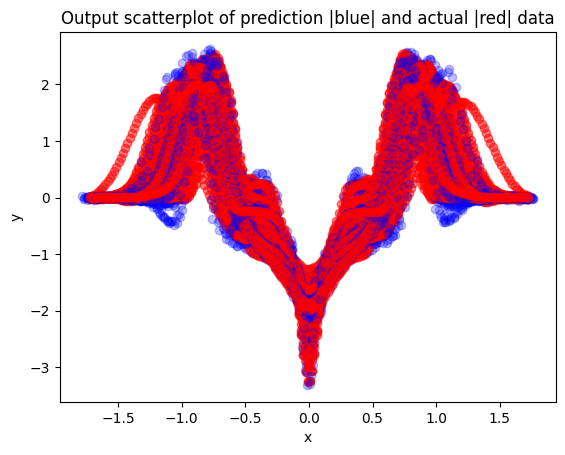

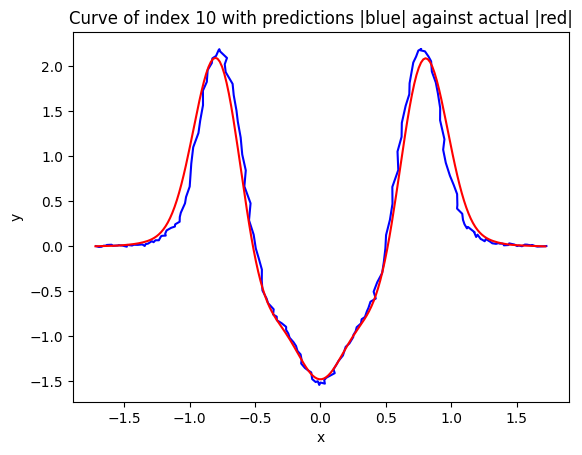

The loss of the curve 0.10061615512312966


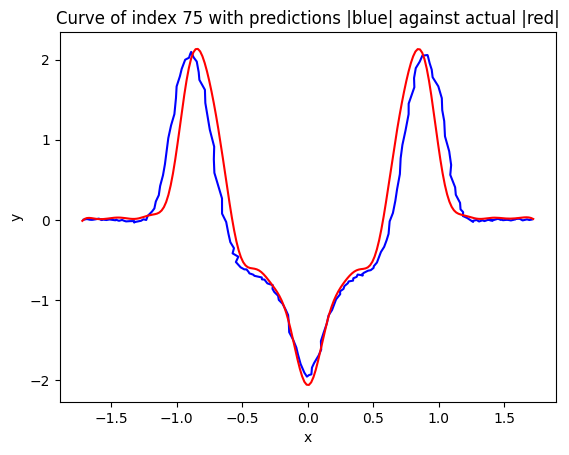

The loss of the curve 0.20805614650035067


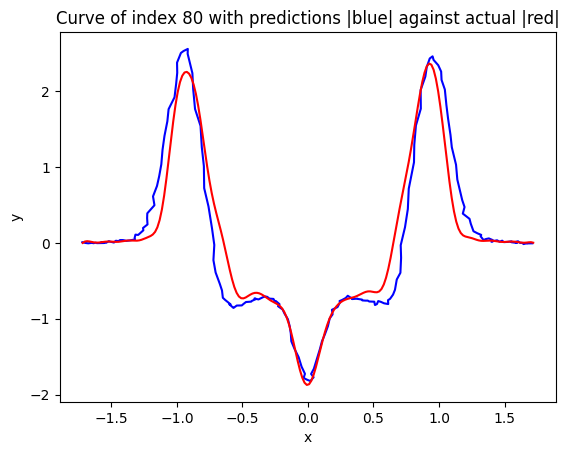

The loss of the curve 0.22036207477605163


In [28]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=200, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(500, activation='relu')(inputs)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.Adam(amsgrad=True), loss=tf.keras.losses.MeanAbsoluteError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=32, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 5ms/step


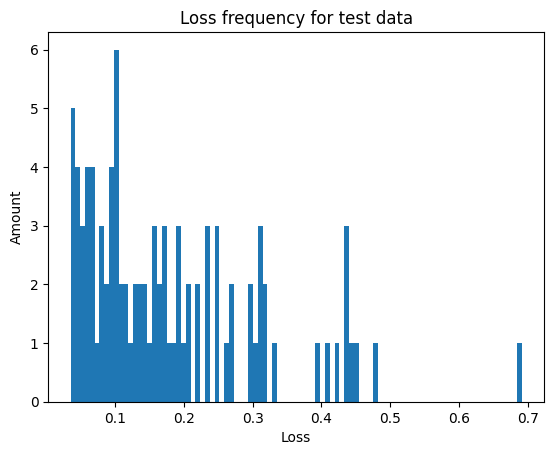

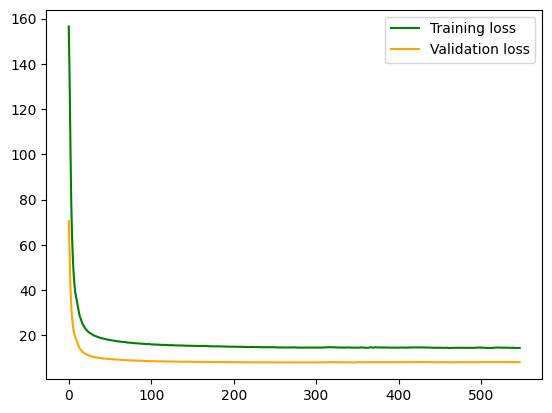

Loss average is: 0.18125246684797303
Loss mode is: [(0.09836, 1), (0.11659, 1), (0.04644, 1), (0.30992, 1), (0.40805, 1), (0.04669, 1), (0.03641, 1), (0.39578, 1), (0.09286, 1), (0.07892, 1)]
Loss median is: 0.14833000000000002
Used time: 37.85997986793518 seconds

3/3 [==============================] - 0s 5ms/step


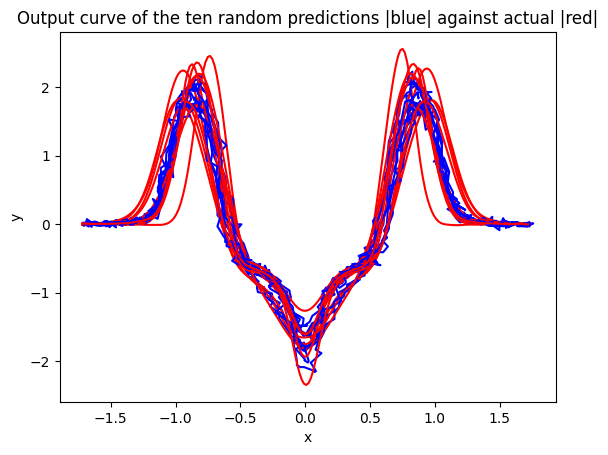

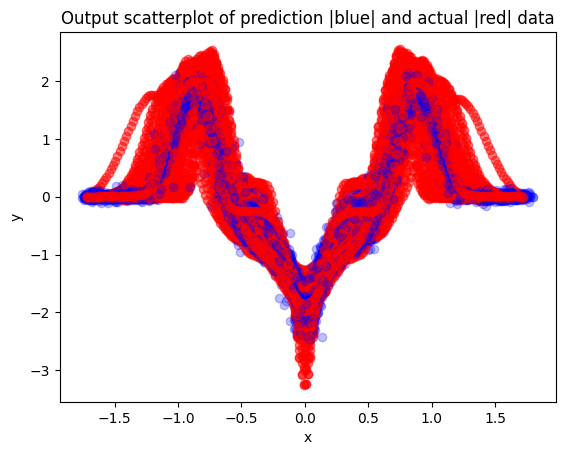

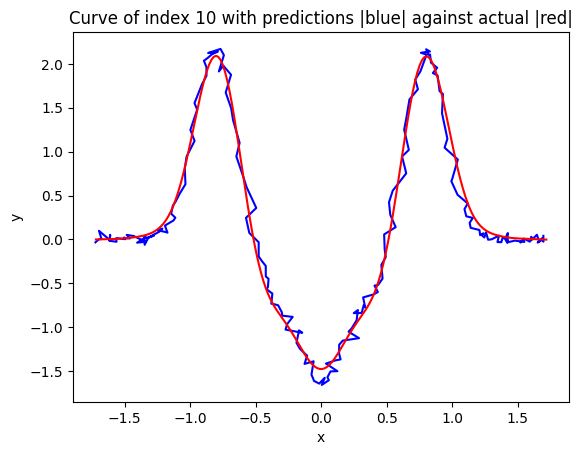

The loss of the curve 0.07000851453172834


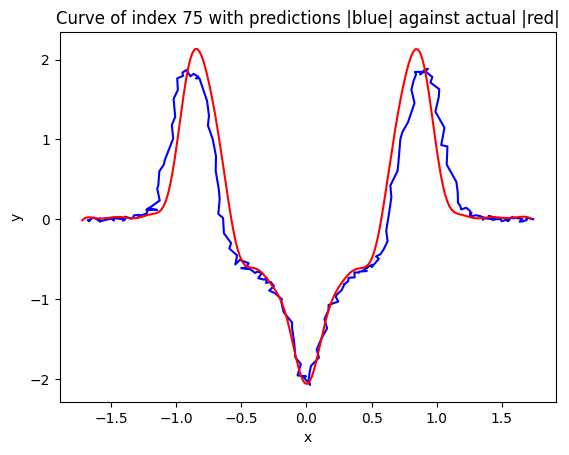

The loss of the curve 0.20413825981383782


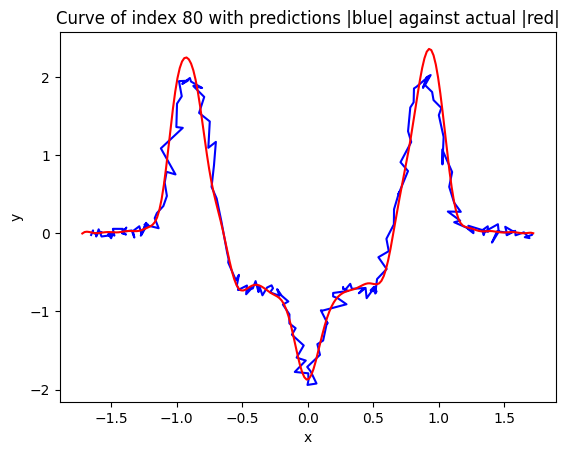

The loss of the curve 0.09176486580831543


In [31]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=200, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1500, activation='relu')(inputs)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.0001, momentum=0.9), loss=tf.keras.losses.MeanAbsoluteError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=158, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 5ms/step


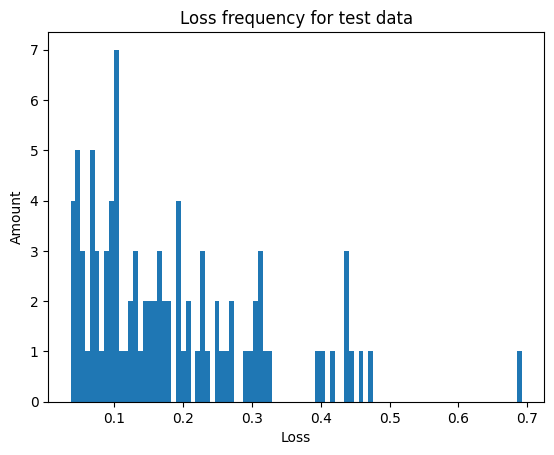

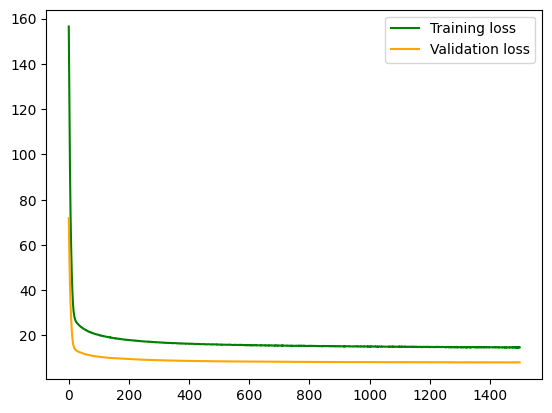

Loss average is: 0.18254849997385972
Loss mode is: [(0.09928, 1), (0.12721, 1), (0.04483, 1), (0.31164, 1), (0.40316, 1), (0.04792, 1), (0.03768, 1), (0.39546, 1), (0.09484, 1), (0.08548, 1)]
Loss median is: 0.151525
Used time: 96.71252155303955 seconds

3/3 [==============================] - 0s 5ms/step


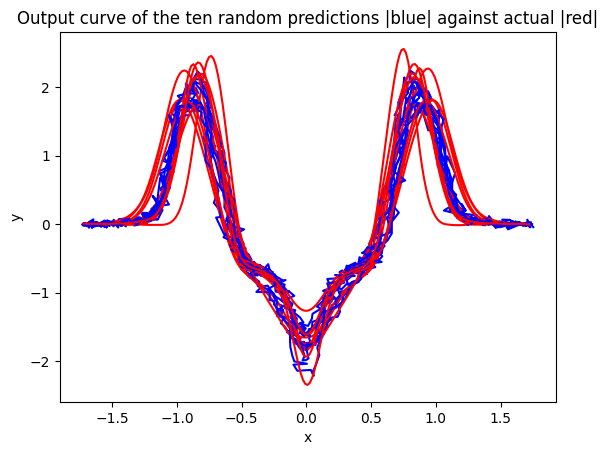

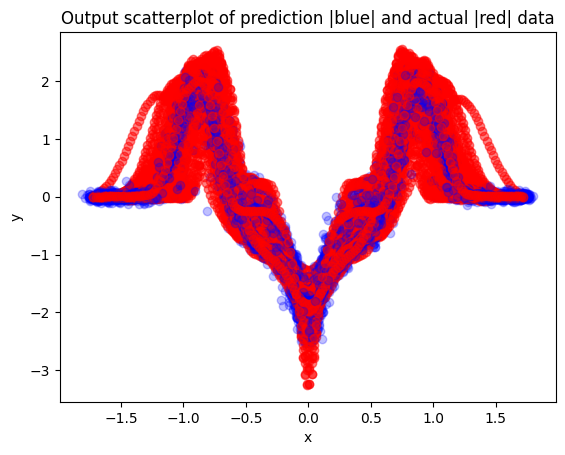

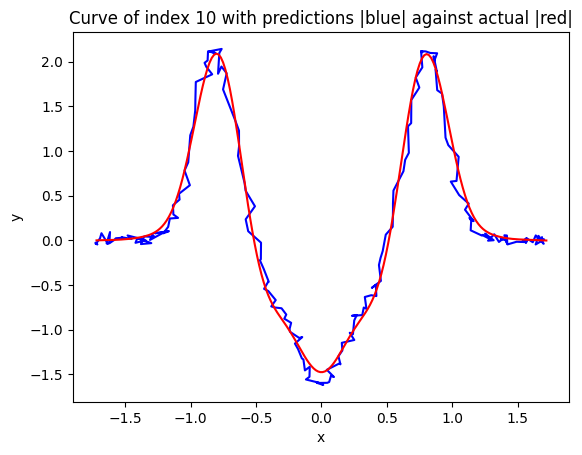

The loss of the curve 0.07202623393985365


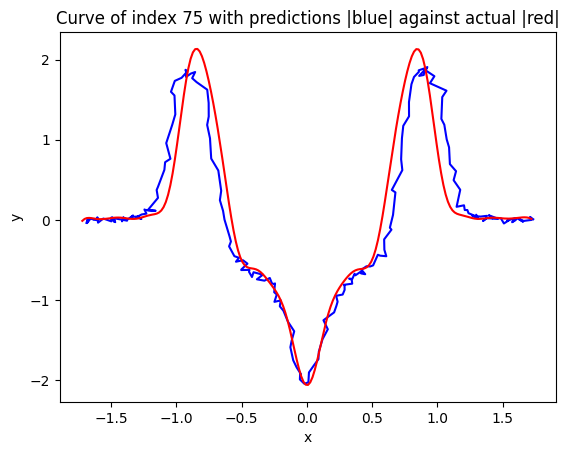

The loss of the curve 0.20419447267367818


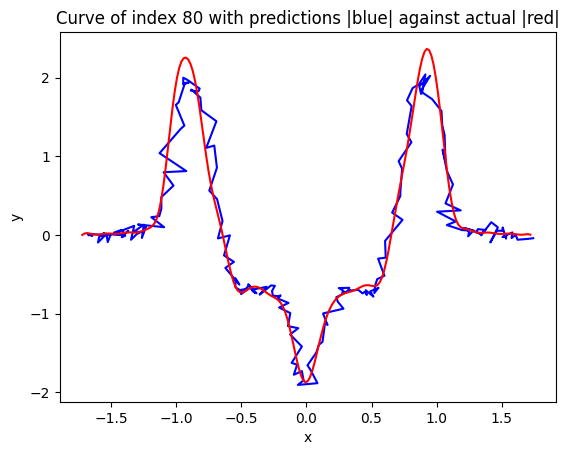

The loss of the curve 0.09946416685512997


In [32]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=200, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1500, activation='relu')(inputs)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.0001, momentum=0.45), loss=tf.keras.losses.MeanAbsoluteError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=158, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 6ms/step


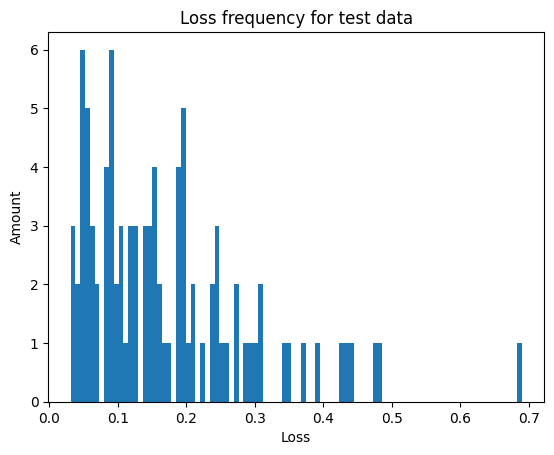

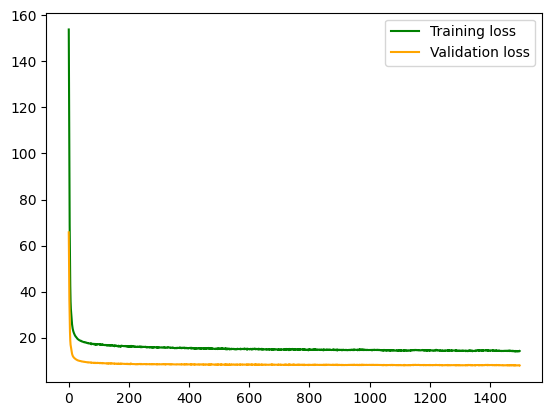

Loss average is: 0.17237440859199912
Loss mode is: [(0.09321, 1), (0.10558, 1), (0.05382, 1), (0.35196, 1), (0.36924, 1), (0.04916, 1), (0.04299, 1), (0.29488, 1), (0.08912, 1), (0.05278, 1)]
Loss median is: 0.146545
Used time: 114.68152379989624 seconds

3/3 [==============================] - 0s 5ms/step


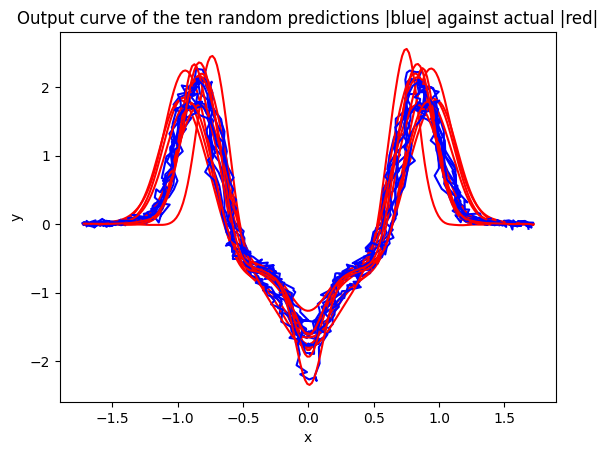

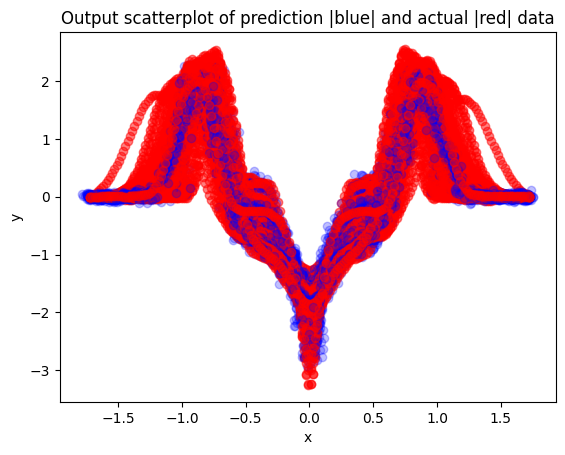

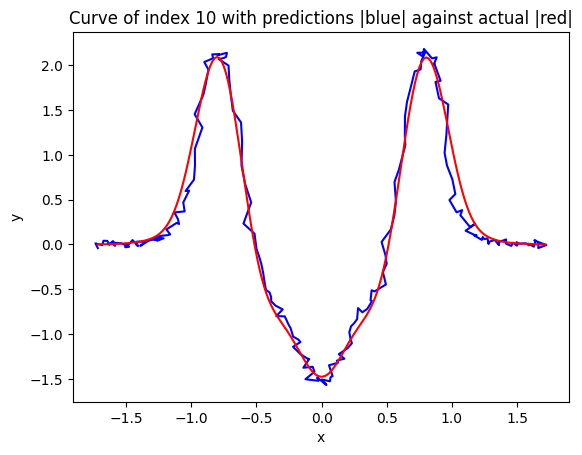

The loss of the curve 0.0809884398250352


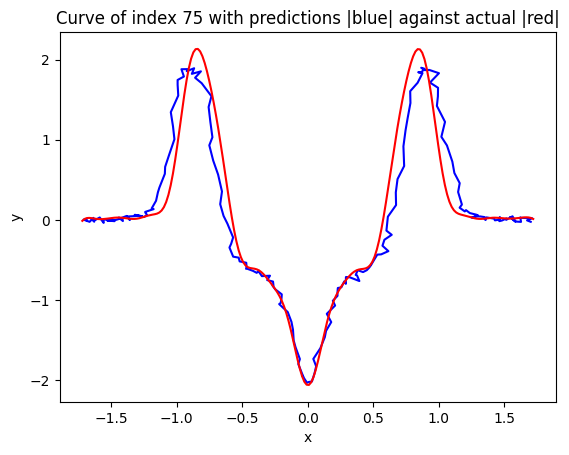

The loss of the curve 0.2088454664160335


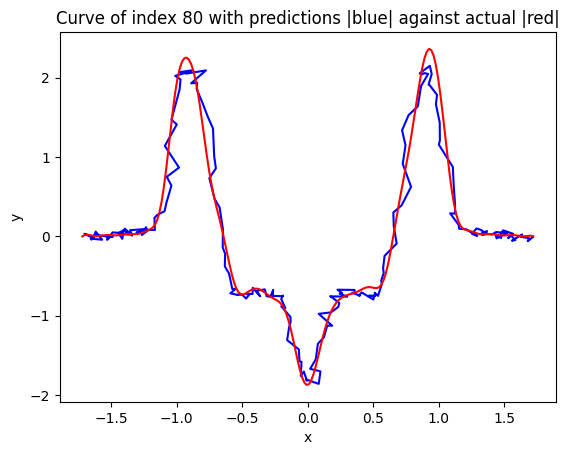

The loss of the curve 0.0847013355507076


In [33]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=200, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1500, activation='relu')(inputs)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.0001,nesterov=True, momentum=0.9), loss=tf.keras.losses.MeanAbsoluteError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=158, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 4ms/step


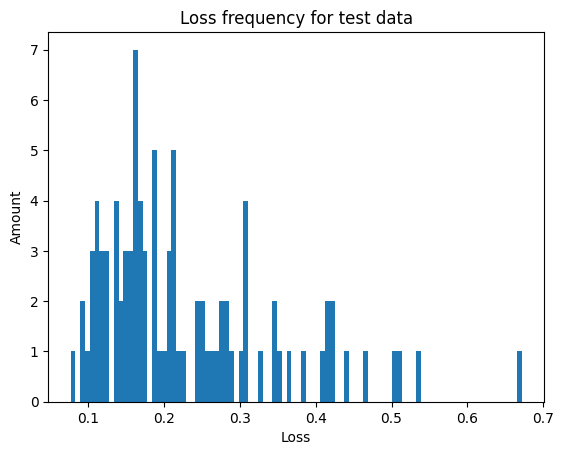

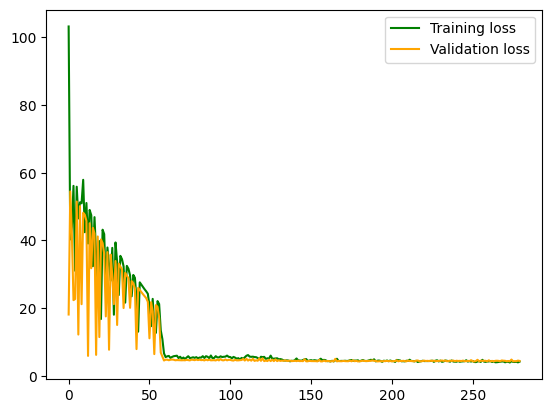

Loss average is: 0.22811514390341875
Loss mode is: [(0.14386, 1), (0.20488, 1), (0.09458, 1), (0.32416, 1), (0.41688, 1), (0.13421, 1), (0.10818, 1), (0.5028, 1), (0.20217, 1), (0.22388, 1)]
Loss median is: 0.189385
Used time: 18.606498956680298 seconds

3/3 [==============================] - 0s 4ms/step


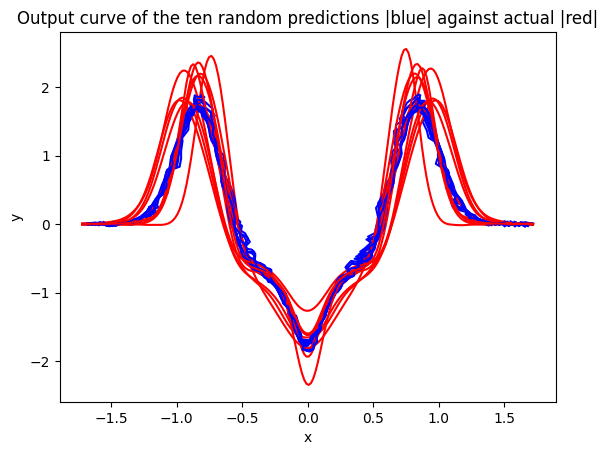

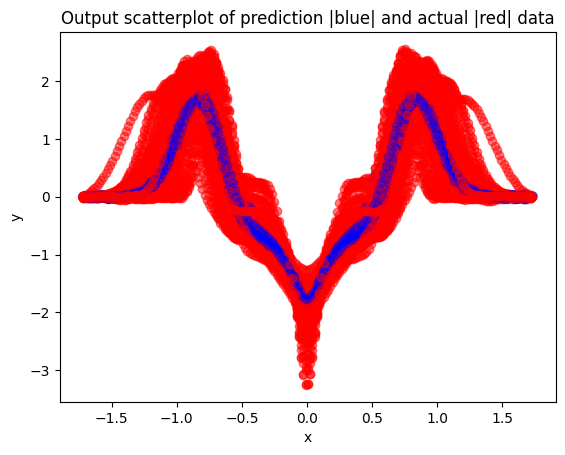

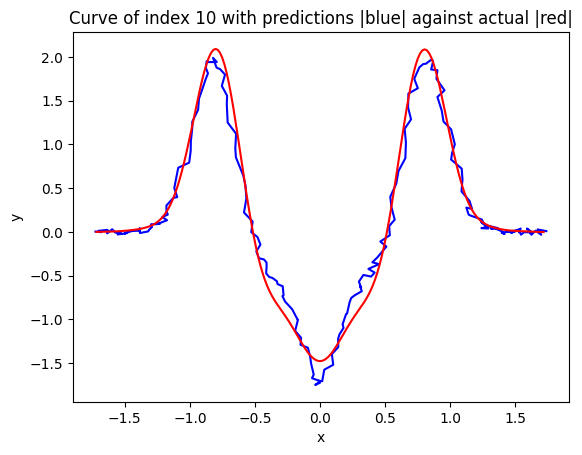

The loss of the curve 0.10164186459681573


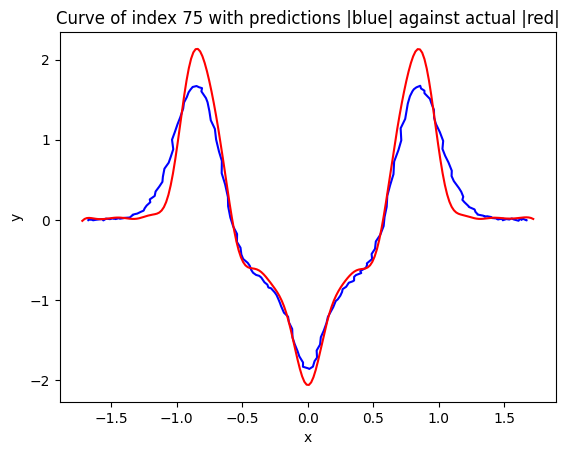

The loss of the curve 0.18552900855035595


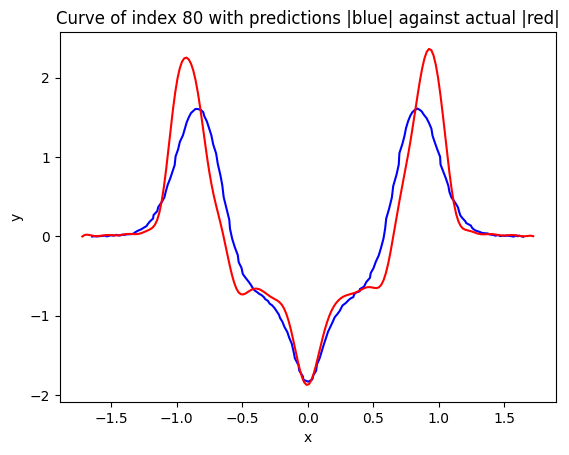

The loss of the curve 0.20838701798915119


In [34]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 4ms/step


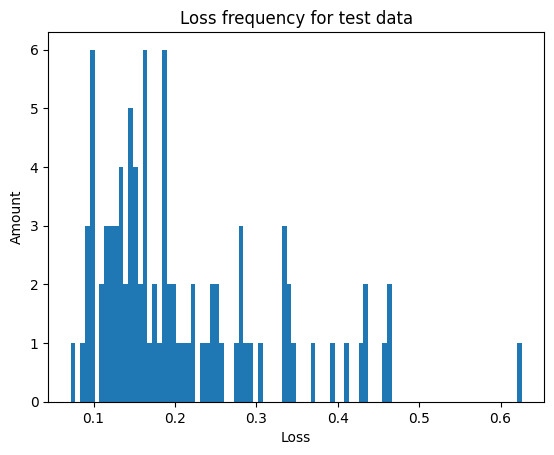

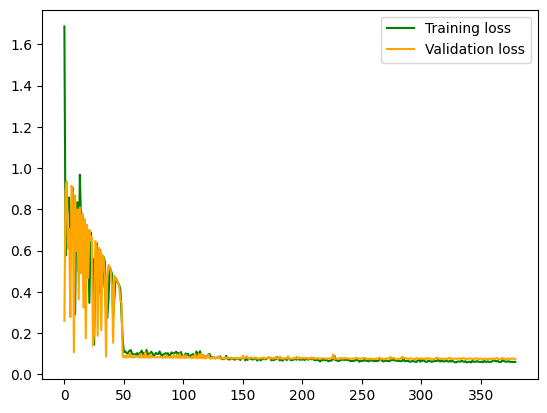

Loss average is: 0.20994488817269913
Loss mode is: [(0.13348, 1), (0.16493, 1), (0.08805, 1), (0.33414, 1), (0.41055, 1), (0.13261, 1), (0.08986, 1), (0.37092, 1), (0.14089, 1), (0.19954, 1)]
Loss median is: 0.176095
Used time: 24.7554669380188 seconds

3/3 [==============================] - 0s 3ms/step


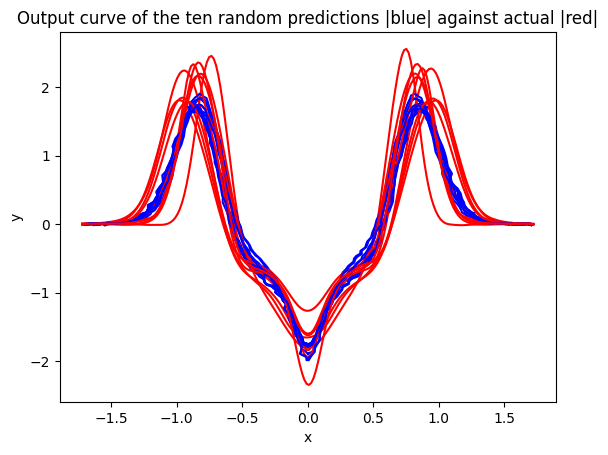

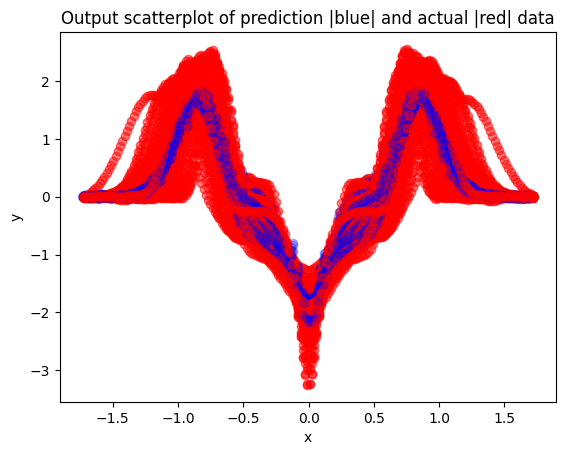

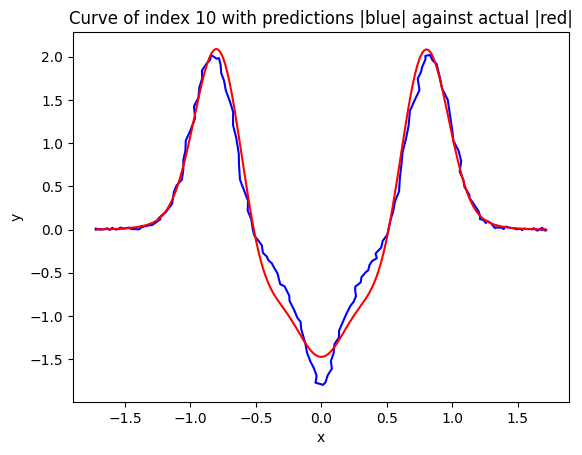

The loss of the curve 0.09491522251033085


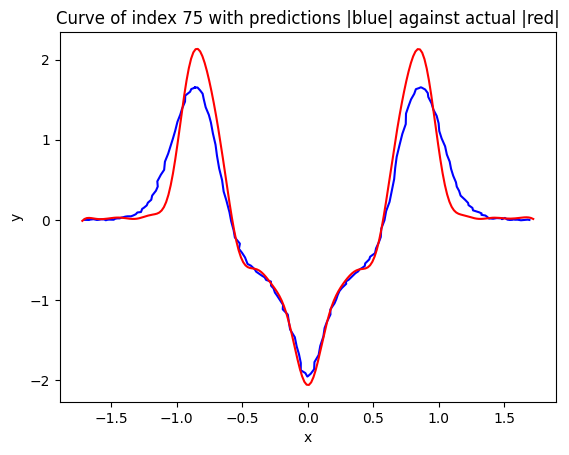

The loss of the curve 0.1841412306202321


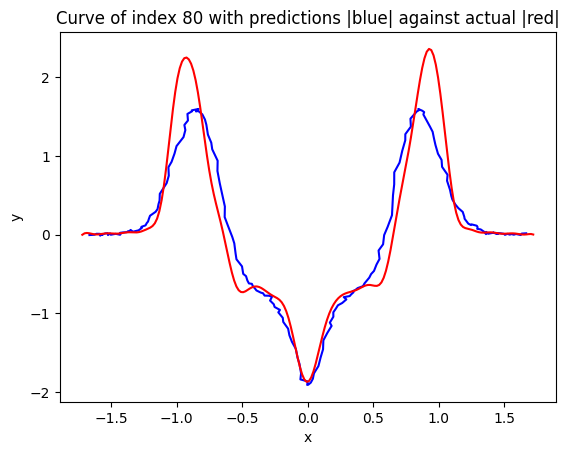

The loss of the curve 0.1911102919688773


In [35]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.NONE))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 4ms/step


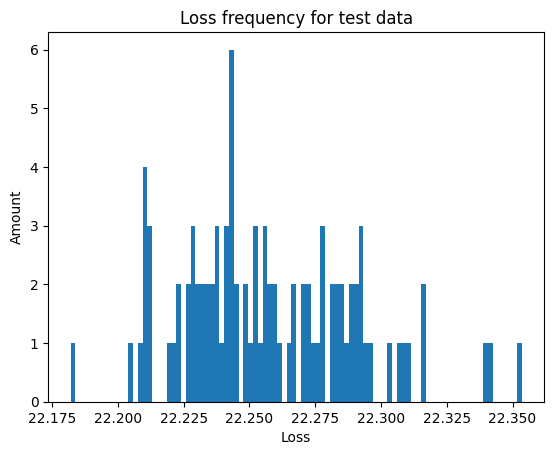

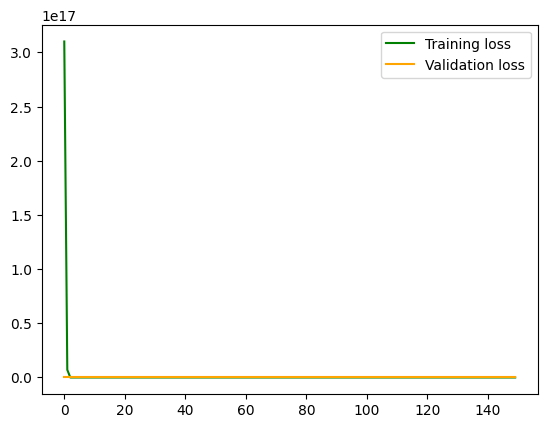

Loss average is: 22.257311512760893
Loss mode is: [(22.24893, 1), (22.2232, 1), (22.29202, 1), (22.30723, 1), (22.22819, 1), (22.27116, 1), (22.23872, 1), (22.35345, 1), (22.25218, 1), (22.25508, 1)]
Loss median is: 22.252495
Used time: 10.608235359191895 seconds

3/3 [==============================] - 0s 3ms/step


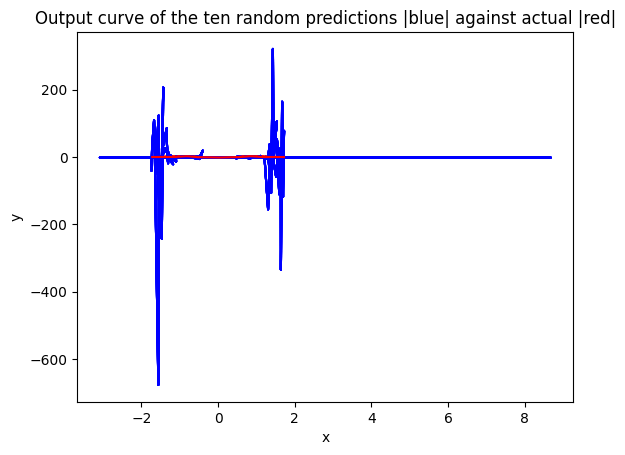

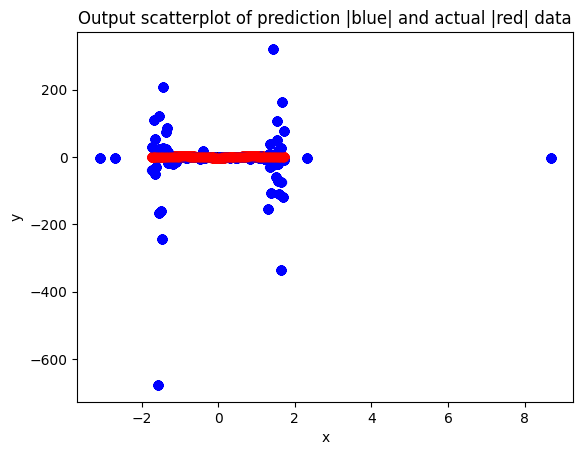

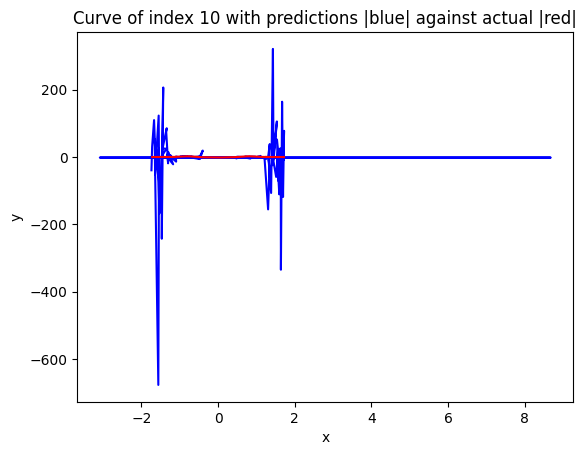

The loss of the curve 22.31025309578989


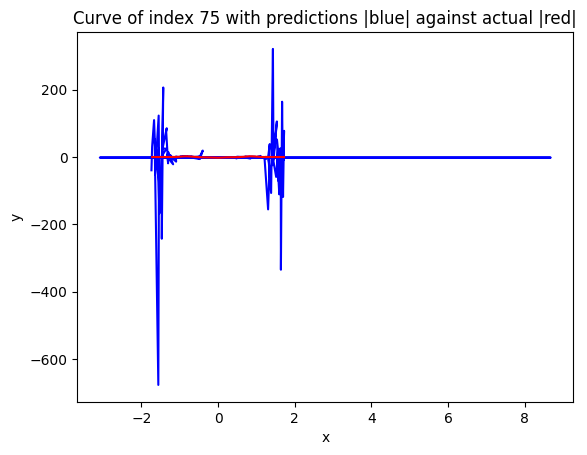

The loss of the curve 22.23851415482246


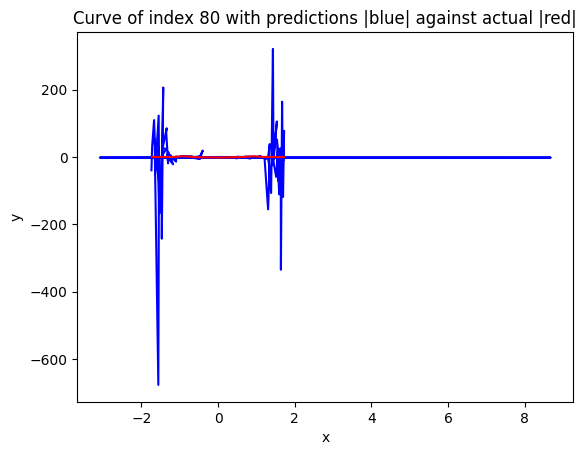

The loss of the curve 22.2238337316282


In [36]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.MeanAbsolutePercentageError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 4ms/step


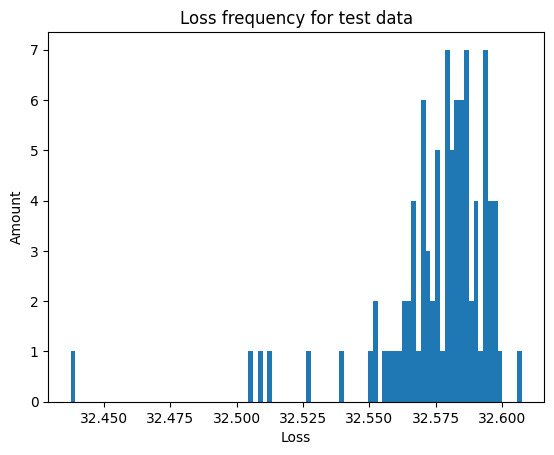

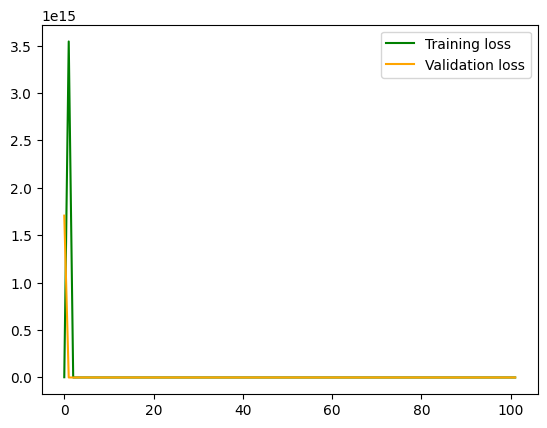

Loss average is: 32.575546369654326
Loss mode is: [(32.60013, 1), (32.56374, 1), (32.58694, 1), (32.55832, 1), (32.51222, 1), (32.58297, 1), (32.59283, 1), (32.59756, 1), (32.56752, 1), (32.56471, 1)]
Loss median is: 32.580349999999996
Used time: 7.397495269775391 seconds

3/3 [==============================] - 0s 4ms/step


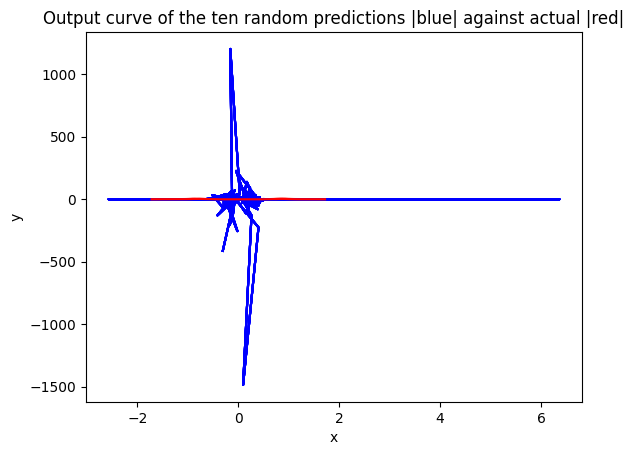

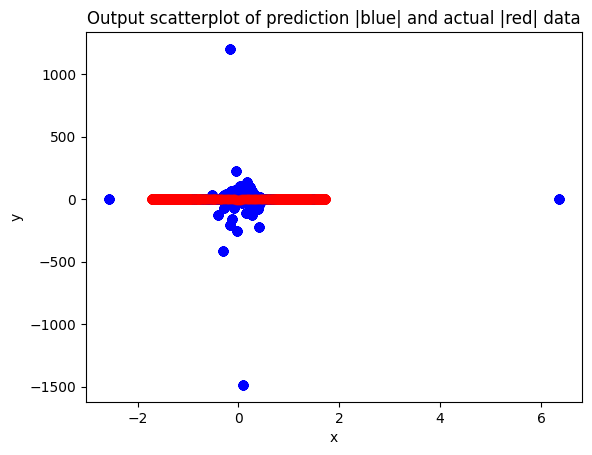

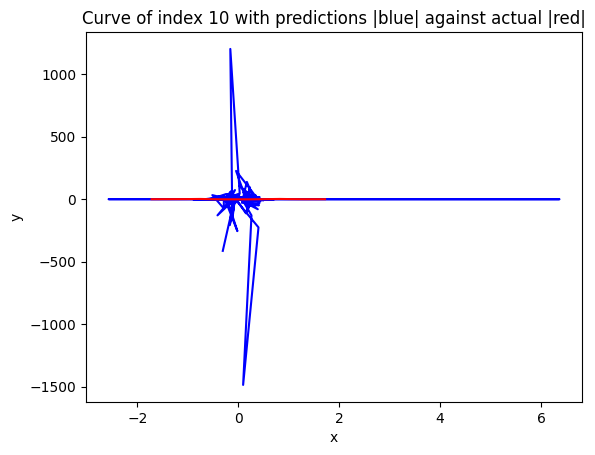

The loss of the curve 32.590912421508484


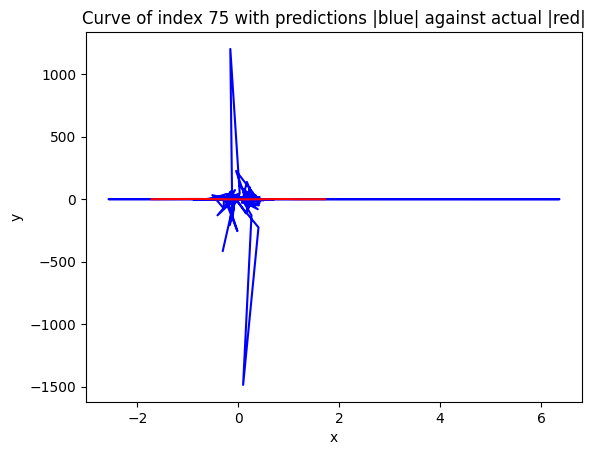

The loss of the curve 32.58228313693016


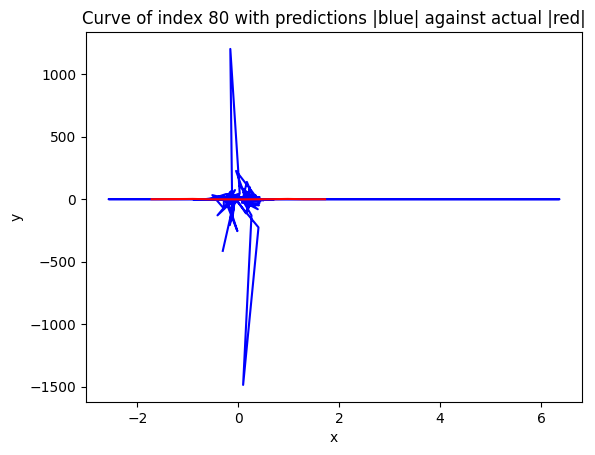

The loss of the curve 32.57302635469307


In [37]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.MeanAbsolutePercentageError(reduction=tf.keras.losses.Reduction.NONE))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 4ms/step


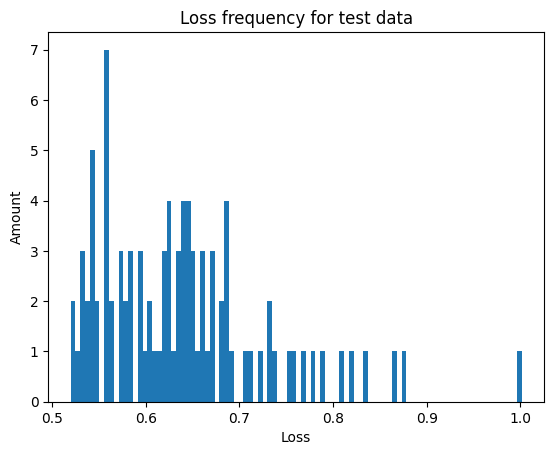

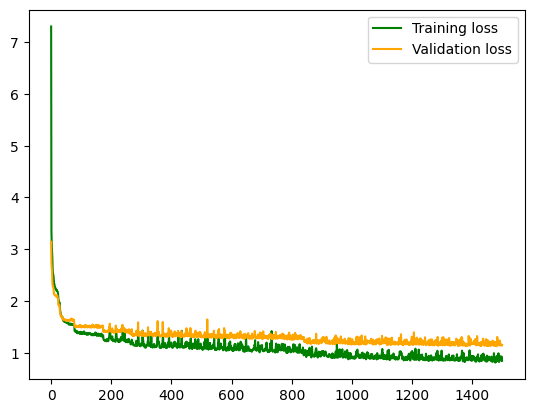

Loss average is: 0.6388120926787327
Loss mode is: [(0.6358, 1), (0.57559, 1), (0.5297, 1), (0.71129, 1), (0.75578, 1), (0.57121, 1), (0.6194, 1), (0.76725, 1), (0.60037, 1), (0.51972, 1)]
Loss median is: 0.629115
Used time: 96.58199858665466 seconds

3/3 [==============================] - 0s 4ms/step


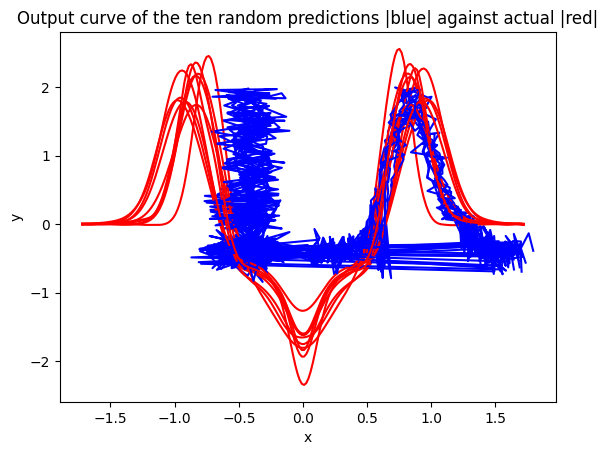

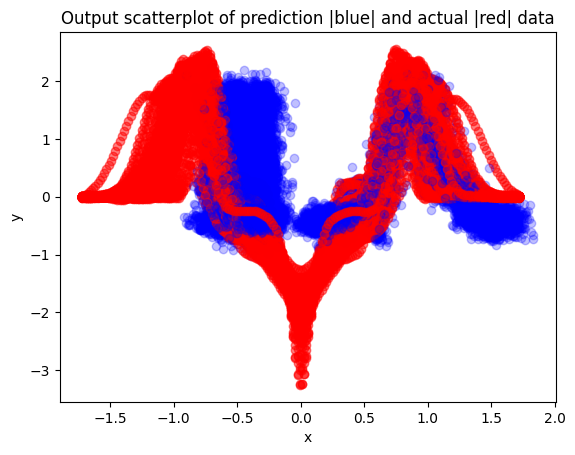

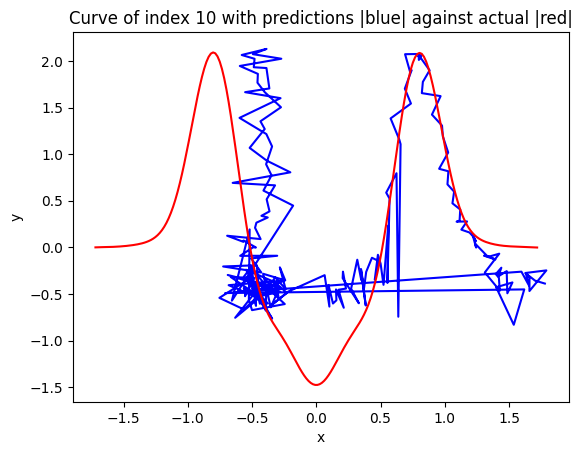

The loss of the curve 0.5375103615803671


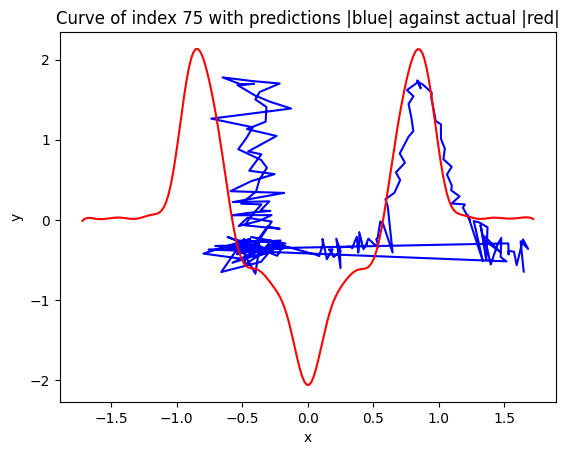

The loss of the curve 0.6518285359479187


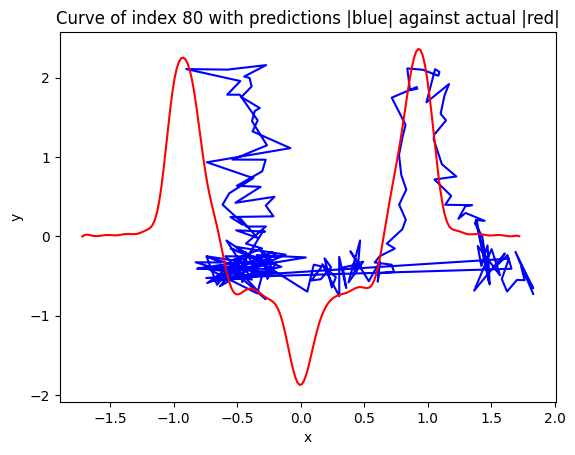

The loss of the curve 0.5821889509139339


In [38]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.MeanSquaredLogarithmicError(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 4ms/step


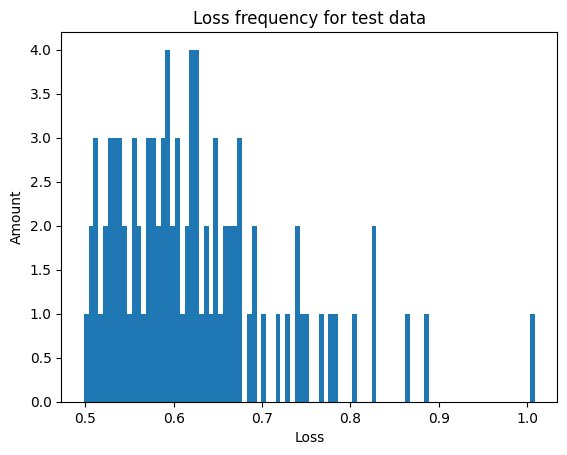

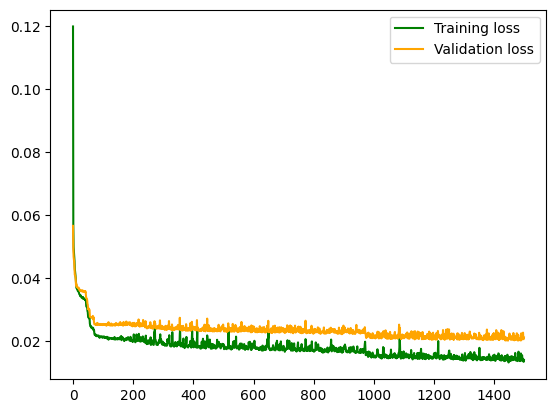

Loss average is: 0.6265090922661702
Loss mode is: [(0.61493, 1), (0.56351, 1), (0.50731, 1), (0.69226, 1), (0.74457, 1), (0.53985, 1), (0.58873, 1), (0.77635, 1), (0.58492, 1), (0.5142, 1)]
Loss median is: 0.608795
Used time: 96.71997833251953 seconds

3/3 [==============================] - 0s 4ms/step


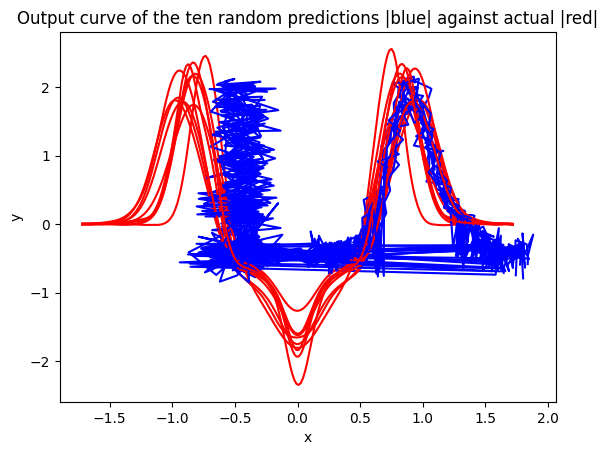

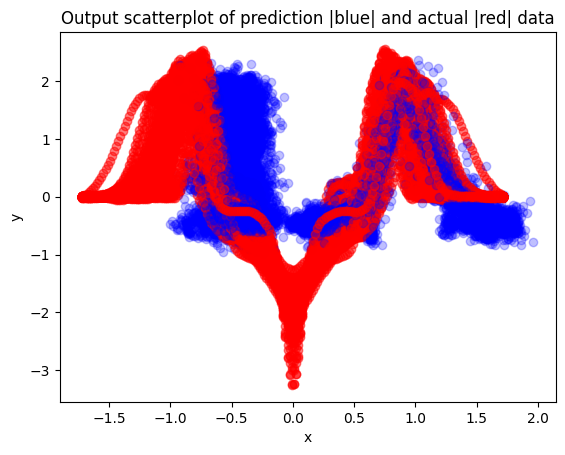

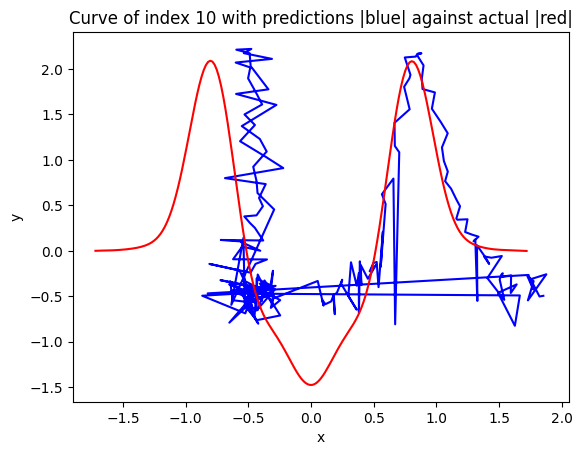

The loss of the curve 0.5310664791051948


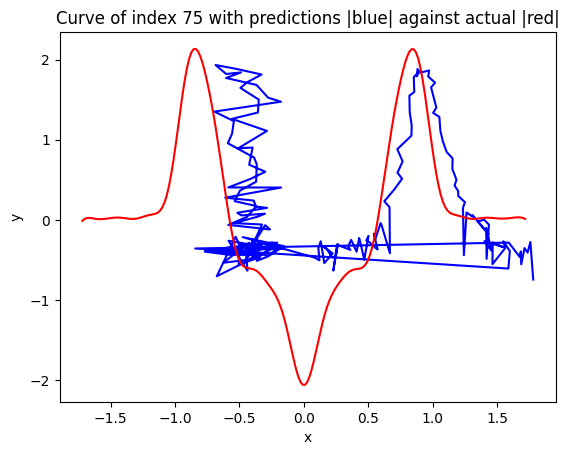

The loss of the curve 0.6441513700999181


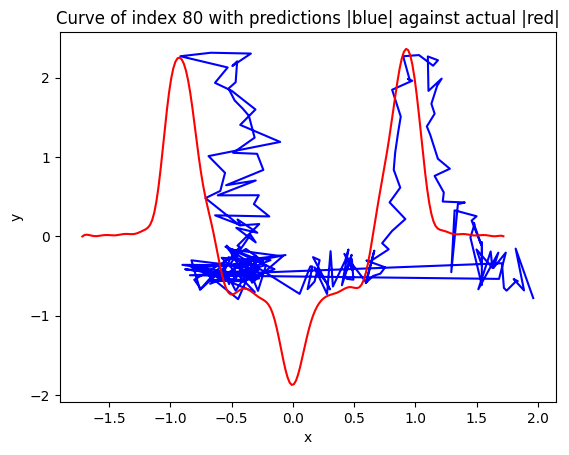

The loss of the curve 0.5757540508787988


In [39]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.MeanSquaredLogarithmicError(reduction=tf.keras.losses.Reduction.NONE))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 4ms/step


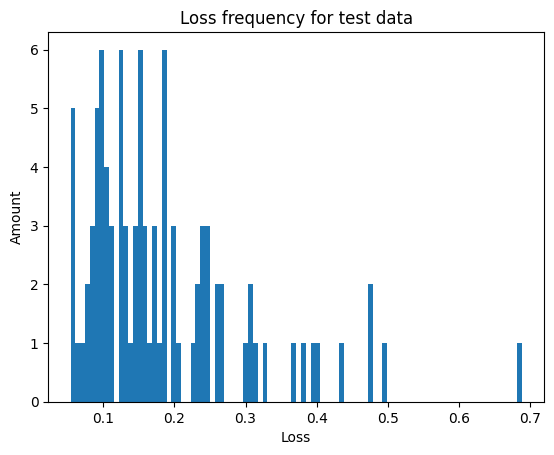

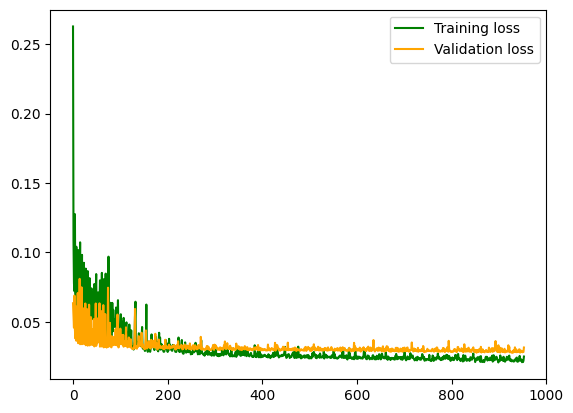

Loss average is: 0.1849852436349749
Loss mode is: [(0.09704, 1), (0.15516, 1), (0.06006, 1), (0.36875, 1), (0.38167, 1), (0.09767, 1), (0.091, 1), (0.32648, 1), (0.13482, 1), (0.10168, 1)]
Loss median is: 0.15496
Used time: 61.94903326034546 seconds

3/3 [==============================] - 0s 4ms/step


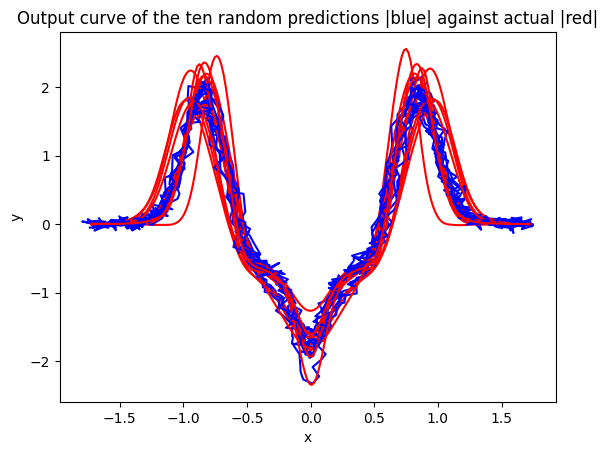

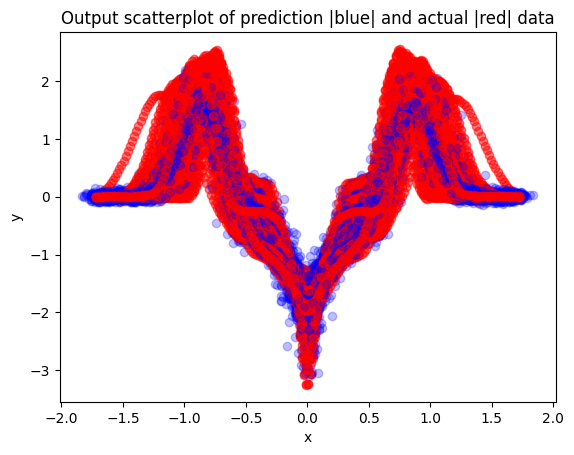

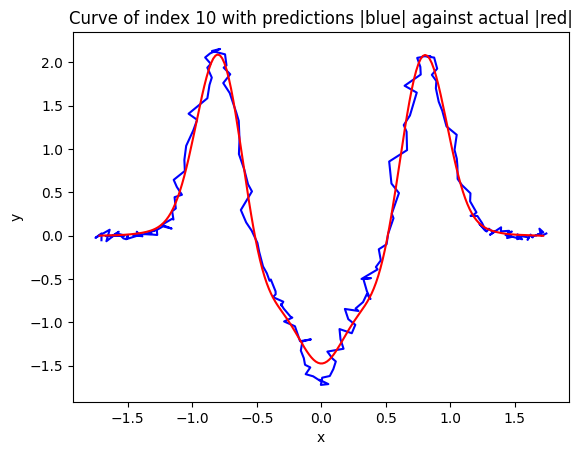

The loss of the curve 0.08153804824757753


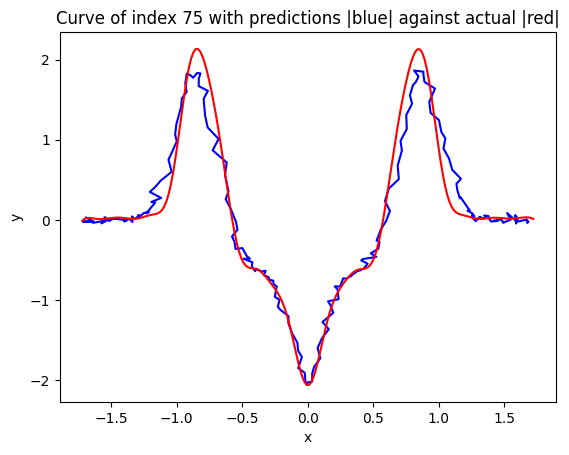

The loss of the curve 0.15330606752257311


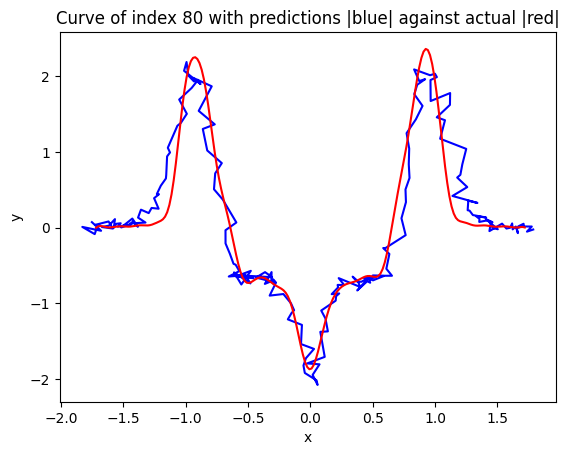

The loss of the curve 0.1308511298814614


In [40]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.LogCosh(reduction=tf.keras.losses.Reduction.NONE))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 4ms/step


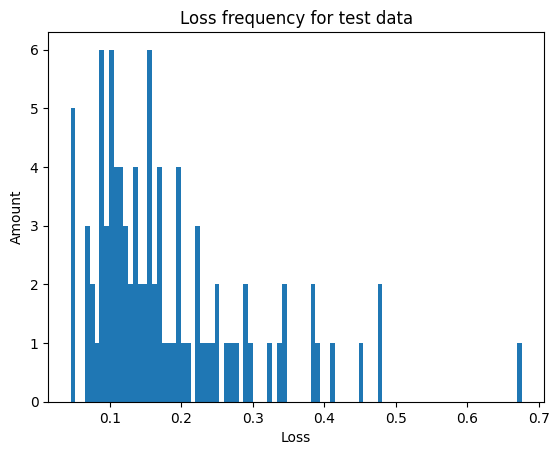

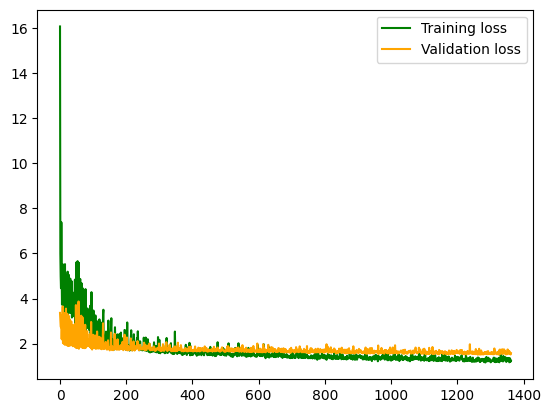

Loss average is: 0.1813113829585394
Loss mode is: [(0.10463, 1), (0.13549, 1), (0.04916, 1), (0.33606, 1), (0.3844, 1), (0.10162, 1), (0.08857, 1), (0.34464, 1), (0.12368, 1), (0.11231, 1)]
Loss median is: 0.15291
Used time: 88.7229733467102 seconds

3/3 [==============================] - 0s 4ms/step


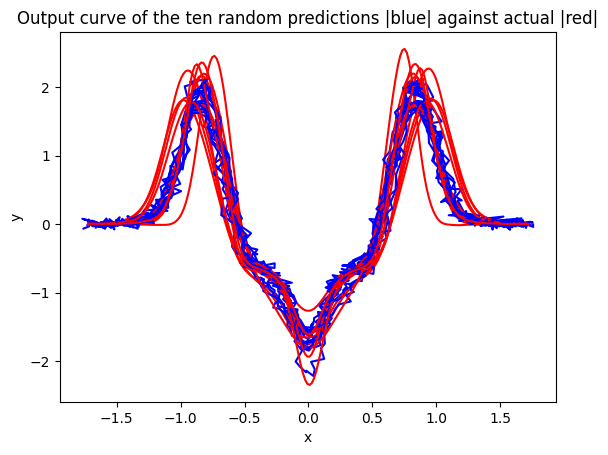

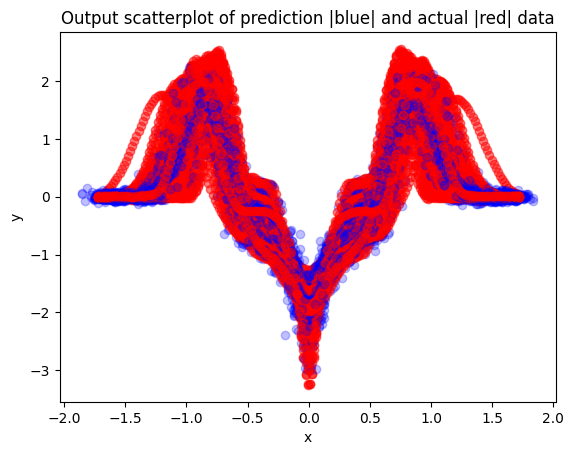

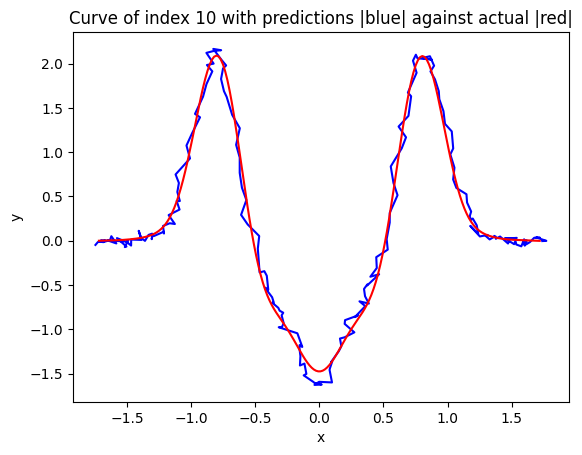

The loss of the curve 0.0716733278191244


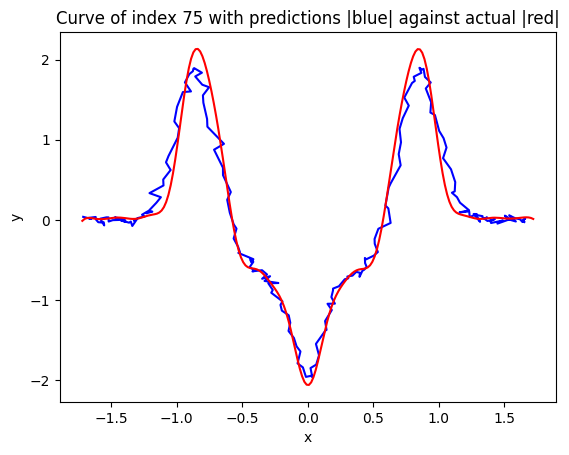

The loss of the curve 0.16045912390172717


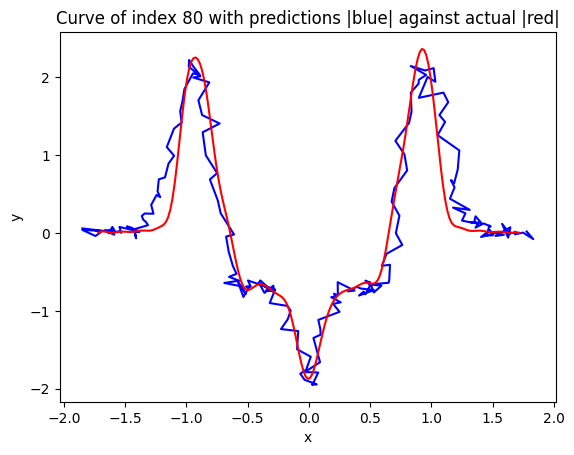

The loss of the curve 0.13256566393222216


In [41]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.LogCosh(reduction=tf.keras.losses.Reduction.SUM))

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))

3/3 [==============================] - 0s 4ms/step


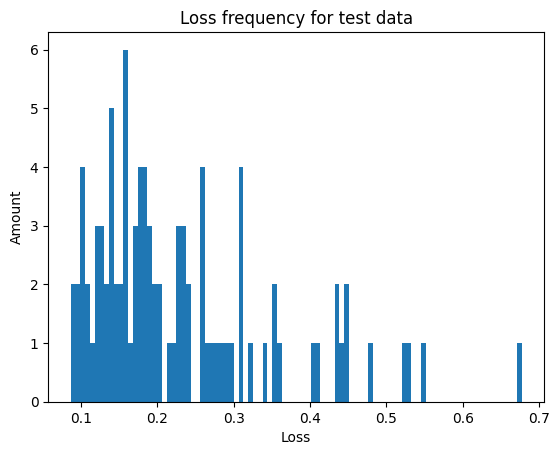

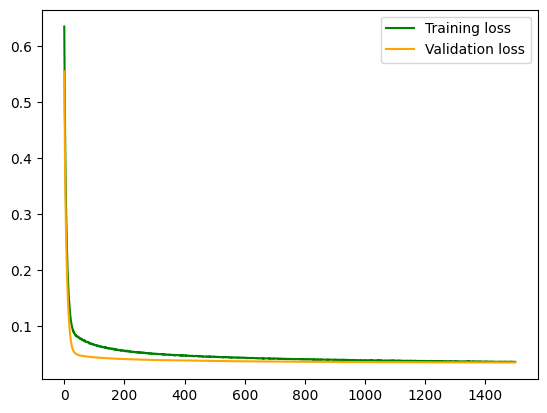

Loss average is: 0.2300036509965821
Loss mode is: [(0.15054, 2), (0.14236, 1), (0.18385, 1), (0.09416, 1), (0.30772, 1), (0.41177, 1), (0.12207, 1), (0.09126, 1), (0.52929, 1), (0.19042, 1)]
Loss median is: 0.1878
Used time: 99.13499808311462 seconds

3/3 [==============================] - 0s 4ms/step


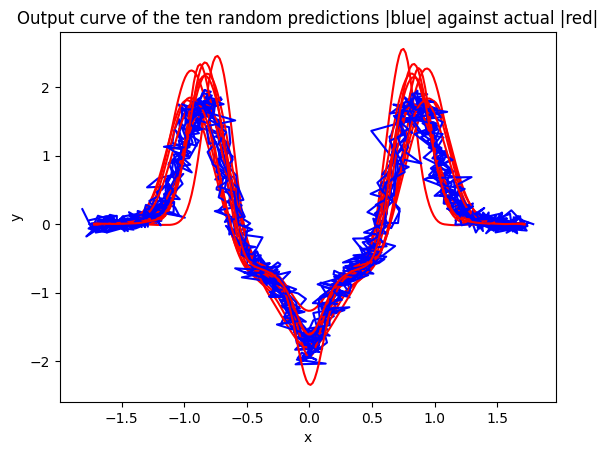

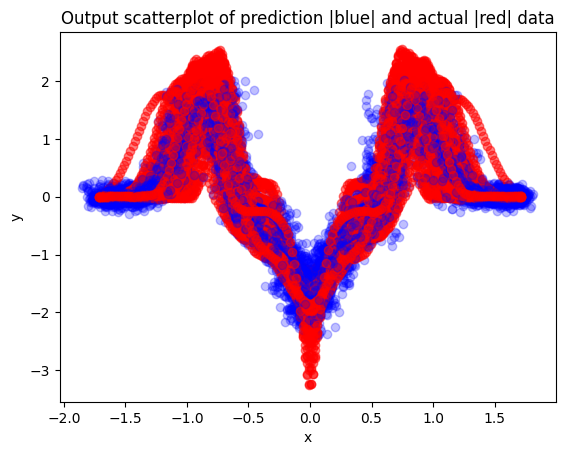

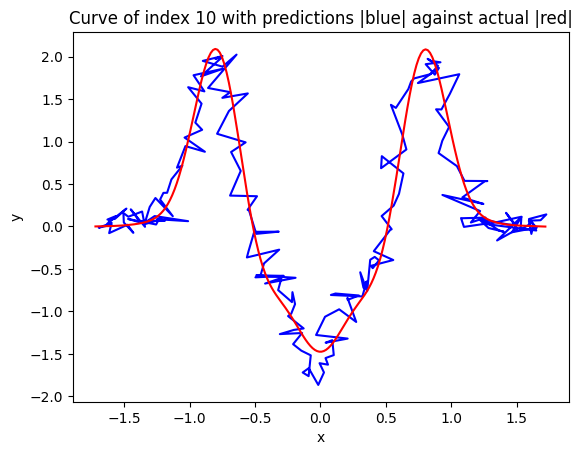

The loss of the curve 0.14202856611555328


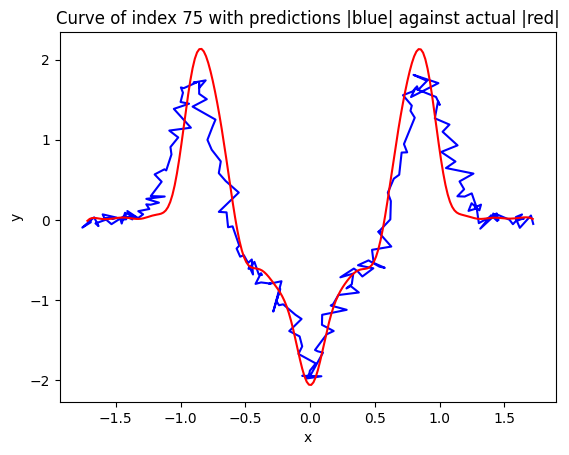

The loss of the curve 0.21438750652416913


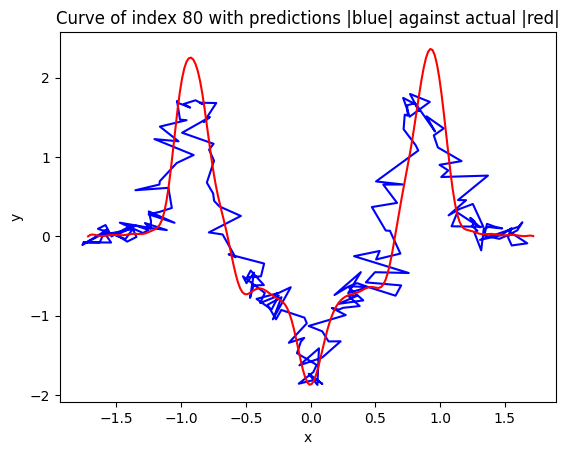

The loss of the curve 0.2040408339478552


In [44]:
general_start_time = time.time()

callbacks = [EarlyStopping(monitor='val_loss', 
                       mode='min', 
                       patience=100, 
                       restore_best_weights=True)]

inputs = keras.Input(shape=(1000,))
x = layers.Dense(1000, activation='relu')(inputs)
x = layers.Dropout(0.1, seed=42)(x)
outputs = layers.Dense(400)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='sgd', loss=tf.keras.losses.Huber())

history = model.fit(train_input, train_output, batch_size=64, epochs=1500, validation_split=0.2, callbacks=callbacks, verbose=0)
results = metrics(test_output, model.predict(test_input))

general_end_time = time.time()

plt.plot(history.history['loss'], color = 'green', label = 'Training loss')
plt.plot(history.history['val_loss'], color = 'orange', label = 'Validation loss')
plt.legend()
plt.show()

print('Loss average is: ' + str(results[0]))
print('Loss mode is: ' + str(results[1]))
print('Loss median is: ' + str(results[2]))
print('Used time: ' + str(general_end_time - general_start_time) + ' seconds')
print('')
plots(test_output,model.predict(test_input))